# COMP9444 Group Project - MedicalMasters

Team Members:

| First name | Last name        | zID      | Email    |
| ---------- | ---------------- | -------- | -------- |
| Ali        | Ghadiri Modarres | z5485577 | a.ghadiri@unsw.edu.au |
| Hyun Wook  | Kim              | z5483096 | z5483096@ad.unsw.edu.au |
| Jannis     | Becktepe         | z5519475 | z5519475@ad.unsw.edu.au ||
| Marla      | Huxhold          | z5523235 | z5523235@ad.unsw.edu.au|
| Muhammad   | Ali              | z5129534 | z5129534@ad.unsw.edu.au |


# Introduction

Modern medicine uses images such as X-ray, magnetic resonance imaging scans or computed tomography for the diagnostic of diseases. Therefore, medical personnel have to go through each picture and identify parts which show signs of illnesses and, including the background information, which disease it could be. Consequently, the evaluation of those images is often time consuming and difficult as diseases can occur in a lot of different shapes and structures and at various locations in the body [1]. This is added by the fast-growing amount of healthcare data needed to be analyzed. Therefore, physicians utilize support tools to aid their work. A successful solution in recent years has been convolutional neural network models (CNN). They present an intelligent solution, which automatically learns features in images and uses them for medical understanding [1, p.2]. This enables them to detect pathological structures in images and to assist in the diagnosing process. One of the biggest breakthroughs was when GoogleNet used to detect cancer had an accuracy of 89% while pathologist only accomplished 70 % [1, p.2].  However, the use of these networks has its own problems. Today’s networks are very complex and often referred to as black boxes [2, p.248] as it is not always possible to comprehend how the classification of images is decided. For critical applications like the processing of medical images, which is the basis of decision making of treatment procedures, this is crucial. Without the knowledge of how the decision making in a network works, limitation and biases might not be recognized [3, p.2]. It is not evident whether the network classifies the images based in features that result in a high accuracy for the existing dataset, but do not reflect the real problem and may possibly lead to incorrect results for unseen inputs. Therefore, explainability methods should be applied to help a user interpret and assesses the results.  One definition for explainability is given by Doshi-Velez and Kim [4]: the ability to justify an outcome in understandable terms for a human. In a medical context this includes: “increasing the systems transparency, assesses the results quality and allow addressing accountability, fairness and ethical concerns” [5, p.203-16].



#Problem-Statement

In our project we will compare the results of four models on the classification of chest X-rays. Moreover, we will contextualize the results and evaluate the usability through the application of different explainability methods as well as compare them to each other.

We will use two CNN models DenseNet and ResNet from TorchXRayVision [6], which were pre-trained on the same dataset we are using. The  other two models are two-of-the-art  pre-trained on ImageNet and will be finetuned by us. This includes another CNN based on the ConvNeXt introduced in the paper ”A ConvNet for the 2020s” (2022) as well as a vision transformer model (ViT) . For the explainabilty methods we will implement GradCam, GradCam++, ScoreCam and EigenCam.

# Required Packages
We make sure all reuiqred python packages are installed before runnning the notebook.


In [ ]:
!pip install -q gdown \
  torchxrayvision \
  timm \
  git+https://github.com/pytorch/captum.git \
  grad-cam

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.0/29.0 MB 35.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 60.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 60.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


# Dataset Source

In this project we will concentrate on the classification of chest radiographs from the CheXpert dataset. It was first introduced in January 2019 and contains 224.316 pictures from 65.240 unique patients in the paper “CheXpert: A Large Chest Radiograph Dataset with Uncertainty Labels and Expert Comparison” [7]. The pictures were collected from studies carried out by the Standford Hospital between October 2002 and July 2017.  An automated rule-based labeler attributed labels of 14 common observations to all chest X-rays.  The validation set of pictures from 200 patients was annotated each by three board-certified radiologists.  

The original dataset has a size of over 470 GB. For that reason and because of our limited computing resource, we chose to use a subset, which includes examples for all the original labels. The subset was found on the Kaggle website and has a size of only 12 GB. It includes 224 thousand images, which are separated into two folders, one for training and the other one for testing as well as two csv files. The files containing rows for respectively the train and test images with 19 columns. The first column hold the path to the images, following by columns for the sex and age as well as information if the X-ray was taken lateral or frontal and if it was taken AP or PA and one for each label.

The project page from CheXpert and the original dataset can be found here: https://stanfordmlgroup.github.io/competitions/chexpert/ (last visited: 06.11.2023, 11:46 am)

The subset on Kaggle can be found under the following link: https://www.kaggle.com/datasets/mimsadiislam/chexpert/data (last visited: 14.11.2023, 1:46 pm)



## Download and extract dataset
This approach uses <i>gdown</i> to download the dataset from Google Drive. However, due to quota limits it might fail. Please use the second approach (from GDrive) in this case.

In [ ]:
# import gdown
# url = "https://drive.google.com/uc?id=1-0YUwrakNPwGckb73vw-PHDCKxmjFFmg"
# gdown.download(url=url, output="chexpert.zip", quiet=False, fuzzy=True)

In [ ]:
#!unzip -q chexpert.zip -d /content
#!rm chexpert.zip

## Download and extract dataset (from GDrive)
You need to have [chexpert.zip](https://drive.google.com/file/d/1-0YUwrakNPwGckb73vw-PHDCKxmjFFmg/view?usp=share_link) in the home directory of your Google Drive.

You can use one of the following options:
1. Use [this notebook](https://colab.research.google.com/drive/1AuW6kAqefQwbHtSHs0T4ll92KCFf_-nS?authuser=1#scrollTo=KHU1MrEeFf6i) to download the dataset to your Google Drive.

2. Use our project account which already has the file in Google Drive:

Username: comp9444mm@gmail.com

Password: medicalmasters9444

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!unzip -q /content/drive/MyDrive/chexpert.zip -d /content

## Load dataset in python

<b>Note:</b> After some discussion, we decided to handle the dataset differently based on the use case. For training, we keep all NaN values and mask them before calculating the loss as done in the original paper.

For evaluation and explanation, however, we replace NaN values with 0.

`xrv.datasets.CheX_Dataset` turns all the -1 values into NaNs to keep things simple.
https://github.com/mlmed/torchxrayvision/blob/master/torchxrayvision/datasets.py#L1053C9-L1053C65

In [ ]:
import torchxrayvision as xrv
import torchvision
import numpy as np
import pandas as pd


def load_chexpert(transform=None, mode='train', strict=False):
    DATASET_PATH = "/content/CheXpert-v1.0-small"

    if mode == 'train':
      csvfile = 'train.csv'
    elif mode == 'test':
      csvfile = 'valid.csv'

    dataset = xrv.datasets.CheX_Dataset(
        imgpath=DATASET_PATH,
        csvpath=f"{DATASET_PATH}/{csvfile}",
        views=["PA","AP"],
        unique_patients=False,
        transform=transform
    )

    if not strict:
      # Convert 1 to 1.0; 0 and NaN to 0.0.
      dataset.labels = (dataset.labels > 0.5).astype(float)

    return dataset

In [ ]:
transform = torchvision.transforms.Compose([
    xrv.datasets.XRayCenterCrop(),
    xrv.datasets.XRayResizer(512),
])

In [ ]:
# With NaNs. This is what we use.
chexpert = load_chexpert(transform, strict=True)
chexpert

{'Atelectasis': {0.0: 17621, 1.0: 29718},
 'Cardiomegaly': {0.0: 22645, 1.0: 23384},
 'Consolidation': {0.0: 30463, 1.0: 12982},
 'Edema': {0.0: 29449, 1.0: 49674},
 'Effusion': {0.0: 34376, 1.0: 76894},
 'Enlarged Cardiomediastinum': {0.0: 26527, 1.0: 9186},
 'Fracture': {0.0: 18111, 1.0: 7434},
 'Lung Lesion': {0.0: 17523, 1.0: 7040},
 'Lung Opacity': {0.0: 20165, 1.0: 94207},
 'Pleural Other': {0.0: 17166, 1.0: 2503},
 'Pneumonia': {0.0: 18105, 1.0: 4674},
 'Pneumothorax': {0.0: 54165, 1.0: 17693},
 'Support Devices': {0.0: 5340, 1.0: 107167}}


CheX_Dataset num_samples=191010 views=['PA', 'AP'] data_aug=None

# Exploratory Data Analysis

The following code performs a basic exploration of the dataset:

Computes summary statistics like count, mean, etc., for numerical columns.

Visualizes the distribution of diseases by plotting the sum of occurrences for each disease.
It mentions a more thorough exploratory data analysis (EDA) will be conducted later.

Note that while you can observe -1s here on the raw csv data, these are converted to 0s when loading the data. Refer to how -1s and NaNs are handled in the following section.

In [ ]:
# Summary statistics for the data
summary_stats = chexpert.csv.describe()
summary_stats

,Age,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Lung Lesion,Edema,Consolidation,Pneumonia,Atelectasis,Pneumothorax,Pleural Effusion,Pleural Other,Fracture,Support Devices,age_years
count,191007.000000,16970.0,45999.000000,52733.000000,118803.000000,25671.000000,90941.000000,67825.000000,38759.000000,77200.000000,74566.000000,120846.000000,21480.000000,26044.000000,113422.000000,191010.000000
mean,60.674179,1.0,-0.023914,0.316310,0.755671,0.231078,0.416270,-0.168050,-0.291700,-0.001852,0.200963,0.557056,0.032216,0.266280,0.936785,60.673227
std,17.815289,0.0,0.650193,0.685951,0.509145,0.513823,0.709154,0.722929,0.669183,0.878496,0.482922,0.636577,0.447000,0.483429,0.274507,17.816772
min,18.000000,1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,49.000000,1.0,0.000000,0.000000,1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,49.000000
50%,62.000000,1.0,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,62.000000
75%,74.000000,1.0,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,74.000000
max,90.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,90.000000


## Labels

### Labels in CheXpert
**Definition of Labels:**
In the CheXpert dataset, labels correspond to various pathologies identified in chest X rays. Each image in the dataset is annotated with labels that indicate the presence or absence of 14 observations related to common diseases.

**Multi-label Multiclass Context:**
CheXpert is a multi-label dataset, meaning each chest X rays can have multiple pathologies tagged (e.g., "No Finding", "Enlarged Cardiomediastinum"). It's also multiclass because there are multiple pathologies that are not mutually exclusive.


### Meaning and Handling of Labels
**Meaning of Labels:**

Each label in the CheXpert dataset represents a specific medical finding from a chest X-ray, such as "Cardiomegaly" or "Pleural Effusion". The labels are critical for training models to accurately identify and classify these medical conditions.

**Meaning of NaNs:**

In CheXpert, NaN (not a number) values are used where the label is unknown or was not provided, indicating uncertainty or unavailability of data regarding the presence of a certain pathology.


**Meaning of Negative Values (-1s):**

The dataset uses -1 to denote uncertainty in the labeling, meaning the expert radiologists were unsure whether the pathology was present. During preprocessing, these -1 values are often replaced with 0 or 1 depending on the chosen approach, such as the U-Zeroes or U-Ones strategy recommended by the CheXpert competition.


**Dealing with Uncertainty (-1s):**

The -1 values indicate that the radiologist was uncertain whether a pathology was present or absent. Replacing -1s with 0s (a strategy known as "U-Zeroes") is a choice that leans towards specificity. It assumes that in uncertain cases, it's safer to err on the side of the pathology being absent rather than incorrectly identifying it as present, which could lead to unnecessary further testing or treatment.

**Handling of NaNs:**

NaNs, on the other hand, represent truly missing annotations. In some modeling practices, NaNs are left as is, and the model is configured to handle these missing values appropriately, either by ignoring them during training or using imputation techniques. In certain models, like decision trees, the handling of NaNs can be intrinsic to the model without the need for explicit replacement. Alternatively, NaNs might be imputed with different strategies depending on the assumed underlying distribution of the data or based on other correlated features in the dataset.
Implications for Model Training and Performance:

### Pathologies:

The dataset contains the following 14 pathologies with counts of each observed:

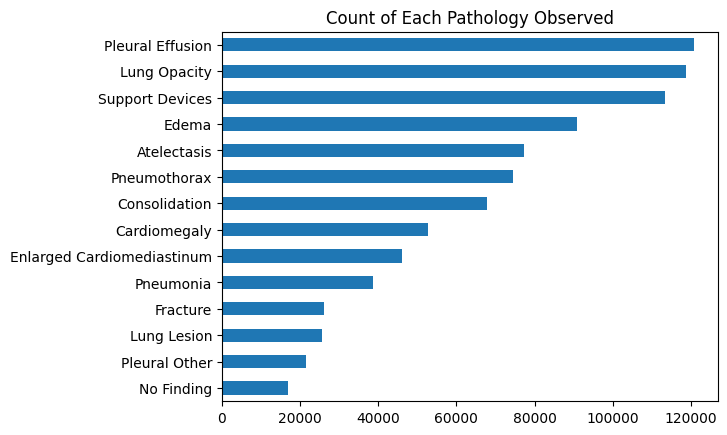

In [ ]:
summary_stats.loc['count', :].drop(['Age','age_years']).sort_values().plot.barh(title="Count of Each Pathology Observed");

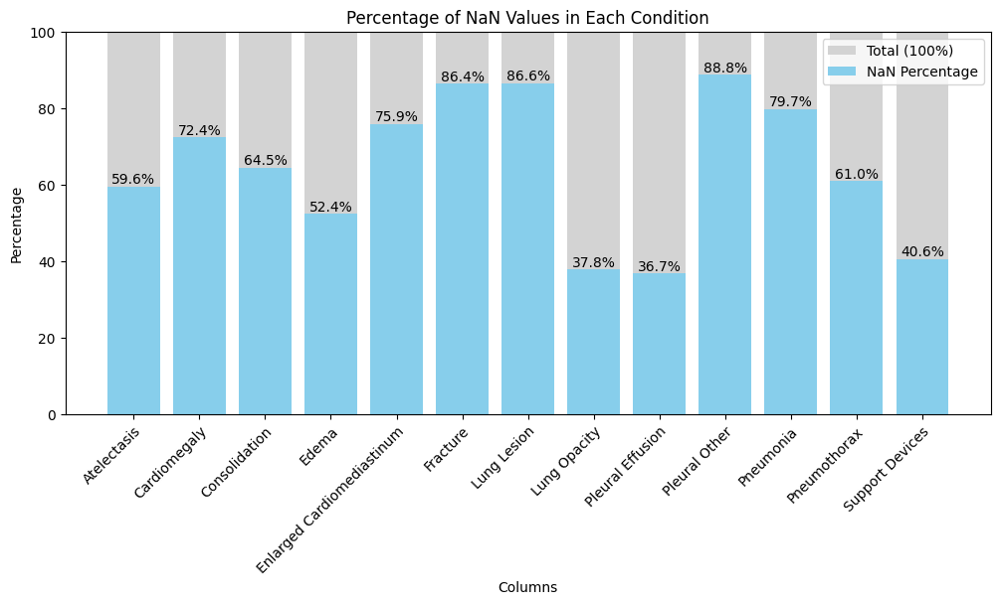

In [ ]:
# Calculate NaN percentage
nan_percentage = chexpert.csv.loc[:, pathologies].isna().mean() * 100

# Plotting
plt.figure(figsize=(12, 5))
bars = plt.bar(chexpert.csv.loc[:, pathologies].columns, [100] * len(chexpert.csv.loc[:, pathologies].columns), color='lightgrey', label='Total (100%)')
nan_bars = plt.bar(chexpert.csv.loc[:, pathologies].columns, nan_percentage, color='skyblue', label='NaN Percentage')

# Adding labels on each NaN bar
for bar in nan_bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', ha='center', va='bottom')

plt.title('Percentage of NaN Values in Each Condition')
plt.xlabel('Columns')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylim(0, 100)
plt.legend(loc='upper right')
plt.show()

The above bar chart indicates the total number of missing values in the cheXpert data set. As mettioned, we'll be replacing the -1 values to 0.


#### **Implications of Replacing -1s with NaNs:**

When -1s are replaced with NaNs, the model is explicitly told to treat these uncertain cases as negatives, which can lead to a more conservative model that prioritizes reducing false positives.
Leaving NaNs as missing allows for different statistical treatments during training, which can lead to a more nuanced model that takes into account the absence of information rather than making an assumption about it.

####  **Evaluation Considerations:**

During evaluation, this approach can affect the model's reported performance metrics. Precision may be artificially increased because the model is less likely to predict uncertain conditions as present. Conversely, recall may decrease because true positives that were labeled as uncertain and converted to 0 are not recognized by the model.

#### **Model Bias:**

There's a risk of introducing bias into the model. If uncertain cases (-1s) are systematically different from true negatives, the model may learn patterns that do not generalize well to other datasets or real-world scenarios where such uncertainty must be addressed differently.



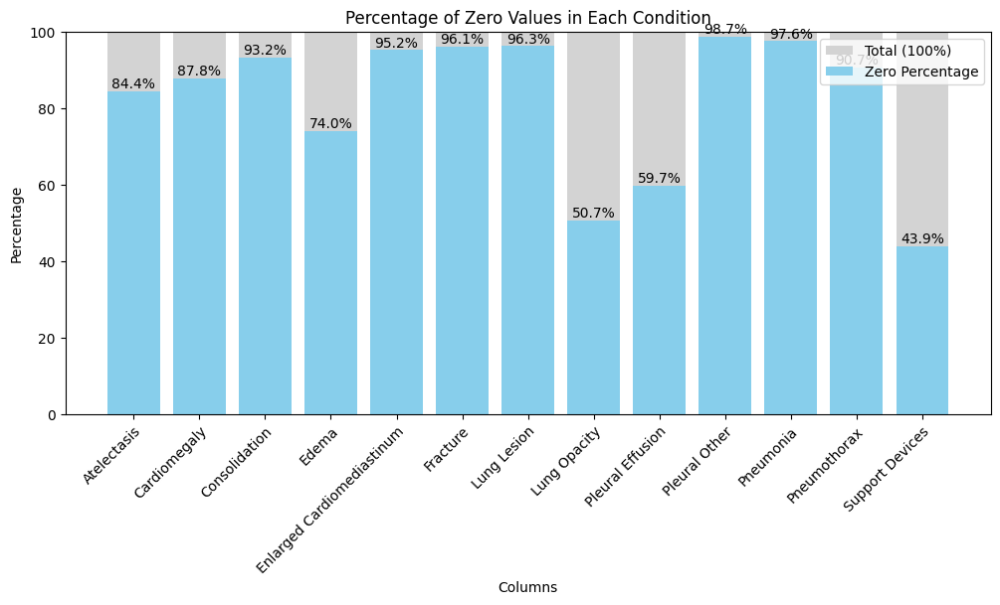

In [ ]:
# Dataframe that only contains the labels with pathologies as the column names

df = pd.DataFrame(chexpert.labels, columns = chexpert.pathologies)

# Calculate percentage of zero values
zero_percentage = (df==0).mean() * 100

# Plotting
plt.figure(figsize=(12, 5))
bars = plt.bar(chexpert.csv.loc[:, pathologies].columns, [100] * len(chexpert.csv.loc[:, pathologies].columns), color='lightgrey', label='Total (100%)')
nan_bars = plt.bar(chexpert.csv.loc[:, pathologies].columns, zero_percentage, color='skyblue', label='Zero Percentage')

# Adding labels on each NaN bar
for bar in nan_bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.1f}%', ha='center', va='bottom')

plt.title('Percentage of Zero Values in Each Condition')
plt.xlabel('Columns')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylim(0, 100)
plt.legend(loc='upper right')
plt.show()

### Counts of Pathologies by *Gender*

In [ ]:
df_by_gender = chexpert.csv[['Sex']].join(df, how='inner')

df_transposed = df_by_gender.loc[df_by_gender['Sex']!='Unknown', chexpert.pathologies + ['Sex']].groupby("Sex").sum().transpose()

df_transposed['Total'] = df_transposed['Female'] + df_transposed['Male']

# Sorting by total counts
df_sorted = df_transposed.sort_values(by='Total', ascending=False)

# Drop the total column for plotting
df_sorted = df_sorted.drop(columns=['Total'])


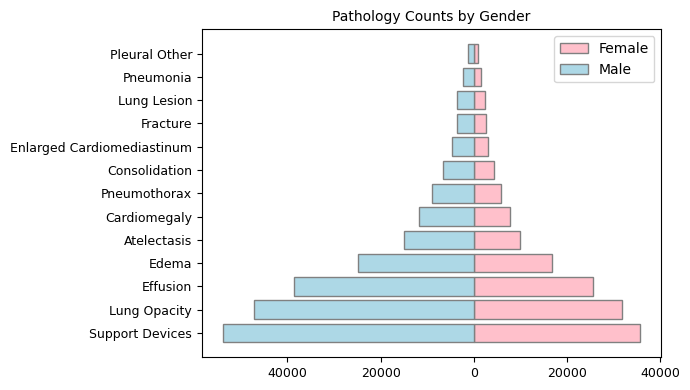

In [ ]:
import matplotlib.pyplot as plt

# Assuming df_sorted is your sorted DataFrame
# Plotting
fig, ax = plt.subplots(figsize=(7, 4))

# Range for the pathologies
y_positions = range(len(df_sorted))

# Female counts (positive, pink)
ax.barh(y_positions, df_sorted['Female'], color='pink', edgecolor='grey', height=0.8)

# Male counts (negative for plotting, light blue)
ax.barh(y_positions, -df_sorted['Male'], color='lightblue', edgecolor='grey', height=0.8)

# Adding the pathology names as y-ticks
ax.set_yticks(y_positions)
ax.set_yticklabels(df_sorted.index, fontdict={'weight': 'light', 'size': '9'})

# Adjusting x-axis ticks to display positive values for both male and female
ticks = ax.get_xticks()
ax.set_xticklabels([int(abs(tick)) for tick in ticks], fontdict={'weight': 'light', 'size': '9'})

# Adding labels and title
ax.set_title('Pathology Counts by Gender', fontdict={'weight': 'light', 'size': '10'})

# Adding a legend
ax.legend(['Female', 'Male'], loc='upper right')

# Display the plot
plt.tight_layout()
plt.show()

### Comparison of Count of Pathologies by Gender

The bar chart above is a horizontal pyramid bar chart comparing the counts of various pathologies by gender in the CheXpert dataset. Each horizontal bar pair represents a specific pathology, with the length of the bar corresponding to the count of cases in the dataset. The bars extending to the right represent female patients, and those to the left represent male patients.

From the visualization, it seems that some pathologies, like "Support Devices" and "Lung Opacity," are more common in the dataset for one gender compared to the other. The graph provides a clear visual comparison of the gender distribution for each pathology, which can be essential for understanding disease prevalence and potential gender-related differences in disease expression or diagnosis within the dataset.







### Counts of Pathologies by *Gender* and *Age*

In [ ]:
df_age_and_gender = (
    chexpert.csv[['Sex', 'Age']]
    .join(df, how='inner')
    .assign(
        AgeBracket=lambda x: pd.cut(x['Age'], bins=[18, 40, 65, 91], right=False, labels=["18-40", "41-65", "65-90"]),
        AgeGender=lambda x: x['Sex'].astype(str) + ' ' + x['AgeBracket'].astype(str)
    )
    .query("AgeBracket.notna() & Sex != 'Unknown'")
    .groupby("AgeGender")[chexpert.pathologies].sum()
    .transpose()
    .assign(Total=lambda x: x.sum(axis=1))
    .sort_values(by='Total')
    .drop(columns='Total')
)
df_age_and_gender

AgeGender,Female 18-40,Female 41-65,Female 65-90,Male 18-40,Male 41-65,Male 65-90
Pleural Other,110.0,300.0,388.0,157.0,585.0,521.0
Pneumonia,205.0,636.0,718.0,319.0,1039.0,993.0
Lung Lesion,313.0,931.0,1059.0,500.0,1529.0,1545.0
Fracture,346.0,992.0,1161.0,521.0,1707.0,1485.0
Enlarged Cardiomediastinum,435.0,1257.0,1434.0,639.0,1987.0,1971.0
Consolidation,580.0,1737.0,1968.0,927.0,2913.0,2702.0
Pneumothorax,817.0,2342.0,2669.0,1199.0,3948.0,3732.0
Cardiomegaly,1078.0,3215.0,3502.0,1625.0,5106.0,4983.0
Atelectasis,1441.0,4015.0,4537.0,2053.0,6560.0,6380.0
Edema,2405.0,6813.0,7561.0,3463.0,10872.0,10517.0


The bar chart shows counts of various pathologies categorized by age and gender. Notable observations include:

- Some pathologies are more prevalent in older age brackets, particularly 'Lung Opacity', 'Effusion' and 'Edema'.
- There's a visible variation in pathology counts between genders within certain age groups.
- The chart highlights the most common pathologies across the dataset, with some conditions showing increased frequency with age.

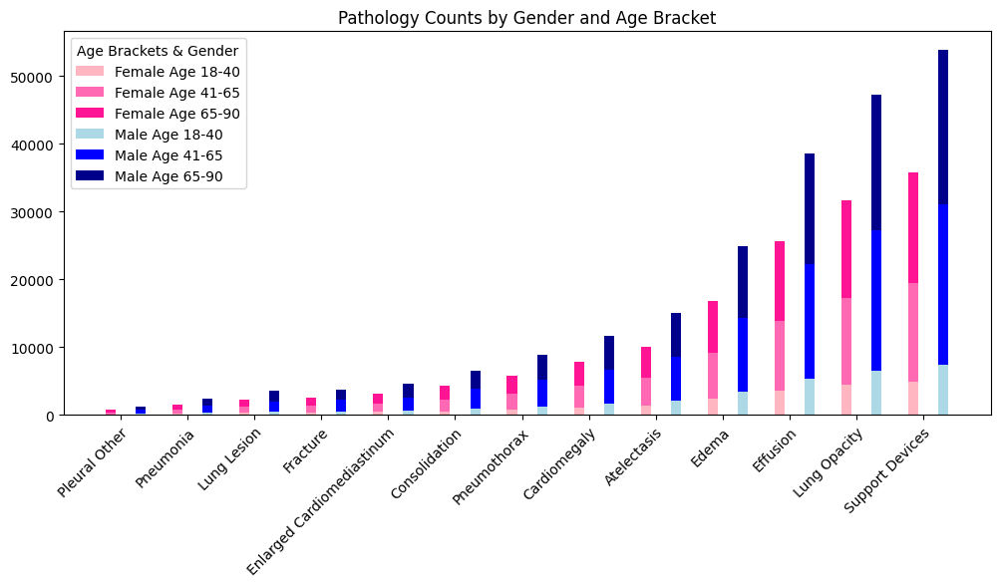

In [ ]:

# Plotting
fig, ax = plt.subplots(figsize=(12, 5))
pathologies = df_age_and_gender.index
age_brackets = ['18-40', '41-65', '65-90']
female_colors = ['lightpink', 'hotpink', 'deeppink']  # Different color for each female age bracket
male_colors = ['lightblue', 'blue', 'darkblue']  # Different color for each male age bracket
bar_width = 0.45  # Width of the bars

# Iterate over pathologies
for i, pathology in enumerate(pathologies):
    # Female bars
    bottom_female = 0  # Starting point for the first female bar
    for j, age in enumerate(age_brackets):
        count = df_age_and_gender.at[pathology, f'Female {age}']
        ax.bar(i - bar_width/2, count, color=female_colors[j], width=bar_width/3, align='edge', bottom=bottom_female)
        bottom_female += count

    # Male bars
    bottom_male = 0  # Starting point for the first male bar
    for j, age in enumerate(age_brackets):
        count = df_age_and_gender.at[pathology, f'Male {age}']
        ax.bar(i + bar_width/2, count, color=male_colors[j], width=bar_width/3, align='edge', bottom=bottom_male)
        bottom_male += count

# Customize the plot
ax.set_xticks(range(len(pathologies)))
ax.set_xticklabels(pathologies)
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
ax.set_title('Pathology Counts by Gender and Age Bracket')

# Create a custom legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=female_colors[i], label=f'Female Age {age}') for i, age in enumerate(age_brackets)] + \
                  [Patch(facecolor=male_colors[i], label=f'Male Age {age}') for i, age in enumerate(age_brackets)]
ax.legend(handles=legend_elements, title='Age Brackets & Gender')

plt.show()


### Analyzing Co-occurrence of Diseases

Analyzing the co-occurrence of diseases in the CheXpert dataset involves examining how frequently different pathologies appear together in the same patients. This can provide insights into potential correlations or common patterns between diseases.

The heatmap below is a visual representation of the co-occurrence matrix for various pathologies. Each cell within the heatmap provides a measure of how often two pathologies occur together, with the color intensity reflecting the frequency or proportion of co-occurrence. The values are normalized between 0 and 1, as indicated by the color bar on the right side of the heatmap.

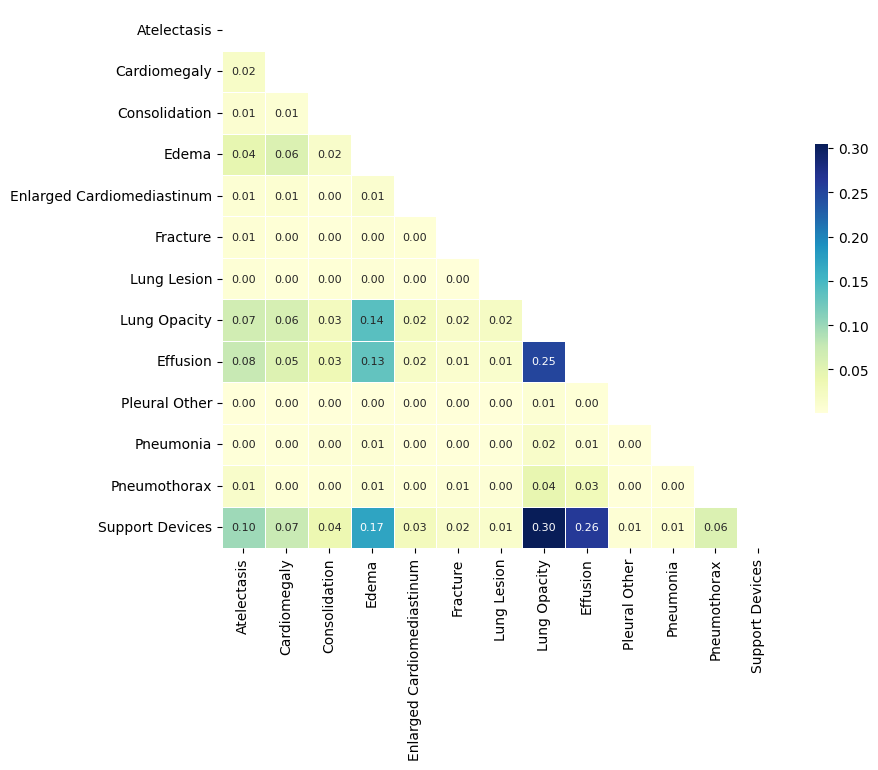

In [ ]:
co_occurrence_matrix_normalized = df.T.dot(df) / len(df)


# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(co_occurrence_matrix_normalized, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(9, 7))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(co_occurrence_matrix_normalized, mask=mask, cmap="YlGnBu", annot=True, fmt=".2f",
            linewidths=.5, cbar_kws={"shrink": .5}, annot_kws = {"size": 8})

plt.show()

This visualization is useful for identifying relationships between different medical conditions, potentially highlighting pathologies that are commonly associated with one another. For instance, the heatmap suggests notable correlations between certain pathologies:

- *Edema* and *Effusion*: Frequently co-occur, reflecting their association with fluid accumulation.
- *Edema* and *Lung Opacity*: Commonly linked, possibly due to fluid in the lungs.
- *Lung Opacity* and *Support Devices*: Often present together, suggesting severe lung conditions.
- *Lung Opacity* and *Effusion*: Regularly coincide, as effusions can cause lung opacities.
- *Effusion* and *Support Devices*: Correlate, indicating effusions may require respiratory support.

These patterns highlight potential clinical interdependencies between these conditions, which could be important for diagnosis and treatment.







## Images
- mention encoding (320x320, grayscale, how many bits per pixel)
- transformations applied:
    - look up the code, different for each model according model properties
- "no finding" is in csv originally, as shown in plot -> is dropped during dataloading -> we only have 13 pathologies

### Show one example per disease

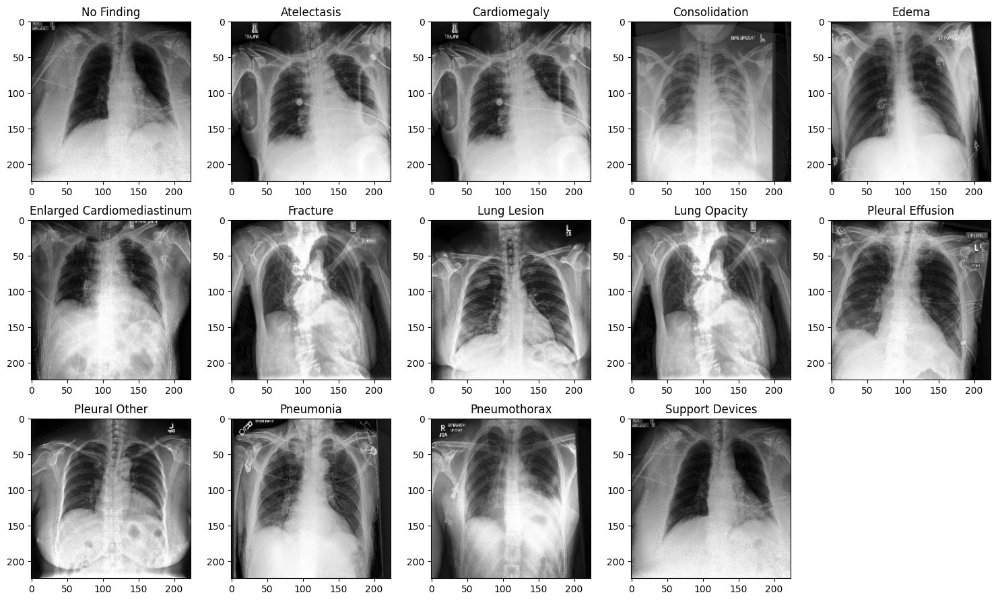

In [ ]:
max_indices = chexpert.csv.loc[:, pathologies].idxmax()

# Extract rows corresponding to max values
example_instances = chexpert.csv.loc[max_indices]

# Load a batch of images
image_paths = example_instances["Path"].tolist()
example_images = load_images(image_paths)

fig, axs = plt.subplots(3, 5, figsize=(15, 9))
axs = axs.ravel()
for i, ax in enumerate(axs):
    if i >= len(example_images):
        ax.set_axis_off()
        continue
    ax.imshow(cv.cvtColor(example_images[i], cv.COLOR_BGR2RGB))
    ax.set_title(pathologies[i])
plt.tight_layout()
plt.show()

# Models

In this section, we focus on the models and methods we selected to perform mutli-label mutli-class classification on the CheXpert dataset. In particular, we train four classification models with different architectures and pre-trained parameters.

First, we elaborate on the classification models and how we adapt them to the given task. We then explain our training procedure in detail including loss functions and hyperparameter configurations.

As mentioned in the EDA section, we faced the challenge of handling NaN values during training. We elaborate on how we tackled this in the respective subsection.

## Image Classification Models

Given an input image, the task is to predict whether each of the pathologies is present. Specifically, this task is called mutli-label mutli-class classification where one or more classes can be assigned to a single input.

Image classification models achieve this task by implicitly extracting relevant features and performing the classification task based on these. In general, these models consist of two main building blocks:
1. The <b><i>backbone</i></b> in an image classification model refers to the initial part of the network, which is performs the feature extraction from the input image. It typically consists of a series of convolutional layers, and pooling layers, which progressively break down the image into a single <b>feature vector</b>.
2. The <b><i>classification head</i></b> typically consists of a single fully connected layer which receives a <b>feature vector</b> and outputs a probability for each outputs class.

The basic architecture is shown in the figure below:


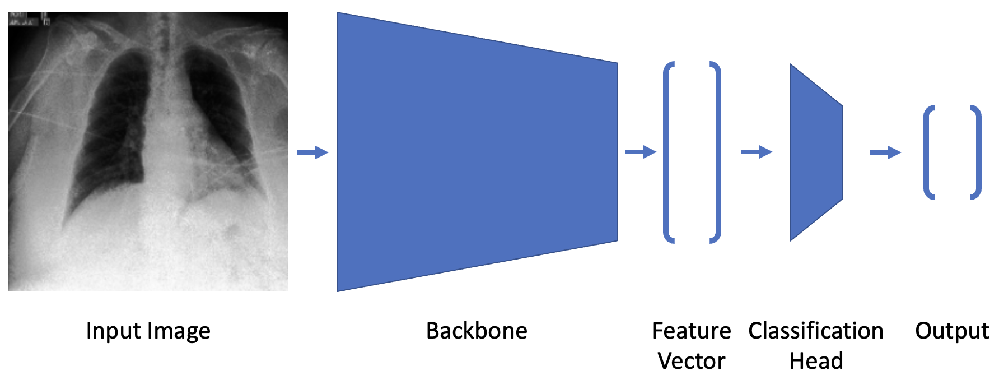

### Model Backbones

In this project, we use the following types of model backbones:
1. <i>DenseNet (6.9M parameters)</i> [1]
2. <i>ResNet (23.5M parameters)</i> [2]
3. <i>VisionTransformer (Vit) (85M parameters)</i> [3]
4. <i>ConvNeXt (27M parameters)</i> [4]

Detailed descriptions of each of the models as well as the reasons why we selected them can be found in the respective subsections.

All of these are already pre-trained on large scale datasets. We can separate them into two classes:
1. DenseNet and ResNet are pre-trained on <b>TorchXRayVision</b> [5]. The library contains various X-ray image datasets for pathology classification including the CheXpert dataset. However, the models were trained to classify 18 different pathologies that do not exactly match the pathologies in the CheXpert dataset. These models benefit from their pre-training on a large set of medical images and thus should be capable of extracting relevant features from X-ray images.
2. ViT and ConvNeXt are pre-trained on <b>ImageNet</b> [6] which is a large scale image database. Here, the task is to perform image classification for 1000 models. Thus, the models are trained with the aim of extracting general purpose high level image features among a broad variety of types and classes. We apply <b>Transfer Learning</b> to fine-tune these models for medical images in CheXpert.



### Adapting the Models to CheXpert

As these models were not initially trained on CheXpert we face the following challenges when applying them to our dataset:

- <b>Number of input channels:</b> As mentioned in the EDA section, CheXpert contains grayscale X-ray images. This applies also to all other datasets in TorchXRayVision. Thus, the pre-trained DenseNet and ResNet models contain an initial convolutional layer with a single input channel. However, in order to run downstream model explanation methods, the models are required to consistently have three input channels. In order to mitigate this mismatch we replace the first convolutional layer while keeping the weights intact. Particularly, we copy the grayscale weights to all three channels of the layer and normalize them. This avoids a mismatch in the following activations due to the summation of three channels instead of a single one. During trainig, we also update the weights of this new layer in order to adapt to the CheXpert dataset.
- <b>Number of output classes:</b> As mentioned before, all four models were pre-trained on datasets containing numbers and types of classes compared to CheXpert. Therefore, we replace the classification heads of all models with a randomly initialized linear layer with 13 outputs. During the training, this layer is trained as well to adapt to the new classification task. It enables us to keep the features that were already learned by the models and only learn how to combine them to output the final classes.

- <b>Thresholds use for normalizing the output predictions:</b> As discussed in the EDA section, we have Nan values in the true labels in the CheXpert dataset, leading to a challenge in handling cases where patients may not have findings for certain diseases. In the torchxrayvision framework's implementation of the pre-trained models i.e., DenseNet and ResNet, they normalize the outputs of the model based on operating thresholds named ***op_threshs*** in the source code associated with each disease label. They achieve this by applying conditional scaling based on the relationships between the model outputs and the thresholds. By creating masks that consider NaN values and incorporating these masks into the scaling process, the function ensures the correct handling of NaN values during normalization. This approach allows for a meaningful normalization of model outputs, even when specific disease findings are absent for certain patients. According to the documentation in the source code, these thresholds are learned and then hardcoded in the code for all of the available chest disease datasets in this framework. Since not all of the 13 diseases we have in the CheXpert dataset are available in the 18 diseases predicted by the torchxrayvision models, we decided to ignore normalizing the output probabilities of our fine-tuned pre-trained models. We could have adopted the same approach if we had access to the whole dataset and enough computational power to learn these thresholds for the 13 diseases we have in the CheXpert dataset, yet due to our limitations, we couldn't follow such an idea. Hence, we opted for eliminating this process altogether instead of normalizing the probabilities with the intersection of the 18 diseases available in the model outputs and 13 ChXpert dataset's diseases, which is just 8 diseases. This approach would cause inappropriate results as we would normalize the output according to a subset of diseases.

### Frameworks

In general, all four models are implemented based on <b>PyTorch</b> and <b>TorchVision</b>, respectively. For the pre-trained DenseNet and ResNet models, we leverage the TorchXrayVision implementations which relies on TorchVision. For ViT and ConvNeXt we use existing implementations in the <b>PyTorch Image Models</b> (timm) package.

For the training, we use data classes, loss functions, and other utilities implemented in PyTorch.

### DenseNet

<b>DenseNet</b> (Densely Connected Convolutional Networks) [1] is architecture of neural networks in which each layer is connected to every other layer in a feed-forward fashion. This design allows feature reuse which makes the network more-parameter efficient. The architecture is known for its efficiency and compactness, especially useful when only limited data is available. Thus, it is a suitable model to be applied in this project.

In this section, we initialize the pre-trained DenseNet implementation in timm. As the network architecture was designed for 224x224 images, we define a custom transformation that is applied to each image before it is passed to the model. Additionally, we expand the number of channels from one to three to match the number of input channels. As mentioned before, we need three input channels for the downstream explanation methods discussed later.

In summary, we perform the following steps to initialize the pre-trained DenseNet:
- We define required transformations including centering, cropping, resizing, and channel adaption.
- We replace the default first convolutional layer (one input channel) with new layer (three input channels) and transfer and normalize the weights.
- We replace the classification head and thus change the number of output classes from 18 to 13.
- We disable the OP thresholds as discussed before.
- We freeze all parameters expect for the first convolutional layer and the classification head. As the model was already trained on X-ray images, we keep the backbone as it is and fine-tune only the layers we had to change.

In [ ]:
import torch
import torch.nn as nn
import torchxrayvision as xrv
import torchvision.transforms as T


densenet_transform = T.Compose([
  xrv.datasets.XRayCenterCrop(),
  xrv.datasets.XRayResizer(224, engine="cv2"),
  T.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1))
])


def pre_trained_densenet(pathologies):
    model = xrv.models.DenseNet(
        weights="densenet121-res224-chex"
    )

    # We need to have 3 channels for the explanation methods
    new_conv0 = nn.Conv2d(
        in_channels=3,
        out_channels=64,
        kernel_size=(7, 7),
        stride=(2, 2),
        padding=(3, 3),
        bias=False
    )

    # Original weights
    old_weights = model.features.conv0.weight

    # Extend weights to 3 channels and normalize
    old_weights_expanded = torch.repeat_interleave(old_weights, repeats=3, dim=1)
    old_weights_expanded /= 3.

    # Copy weight to all 3 new channels
    with torch.no_grad():
        new_conv0.weight.copy_(old_weights_expanded)

    # Replace layer
    model.features.conv0 = new_conv0

    # Adapt classification head to our dataset
    model.classifier = nn.Linear(
        in_features=1024,
        out_features=len(pathologies),
        bias=True
    )
    # op_thresh = model.op_threshs[~torch.isnan(model.op_threshs)].mean()
    # model.op_threshs = torch.tensor([op_thresh] * len(pathologies))
    model.op_threshs = None

    for param in model.parameters():
        param.requires_grad_(False)

    for param in model.features.conv0.parameters():
        param.requires_grad_(True)

    for param in model.classifier.parameters():
        param.requires_grad_(True)

    model.pathologies = [p for p in pathologies]

    return model

### ResNet
<b>ResNet</b> (Residual Networks) [2] is a neural network architecture containing residual blocks in the input of a block is added to its output. It allows to train deeper networks by mitigating the problem of vanishing gradients. It introduces skip connections that bypass one or more layers, facilitating easier training. ResNet variants, such as ResNet-50 and ResNet-101, differ in their number of layers. We selected the ResNet-50 variant included in TorchXRayVision as second pre-trained model. Alongside DenseNet, it serves as a baseline of commonly known and used networks for image classification.

The ResNet initialization is analog to the DenseNet section above except for syntactical differences according to the model definition and implementation.

In [ ]:
import torchxrayvision as xrv
import torch.nn as nn
import torchvision.transforms as T

resnet_transform = torchvision.transforms.Compose([
    xrv.datasets.XRayCenterCrop(),
    xrv.datasets.XRayResizer(512, engine="cv2"),
    T.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1))
])


def pre_trained_resnet(pathologies):
    model = xrv.models.ResNet(
        weights="resnet50-res512-all"
    )

    resnet = model.model

    # We need to have 3 channels for the explanation methods
    new_conv1 = nn.Conv2d(
        in_channels=3,
        out_channels=64,
        kernel_size=(7, 7),
        stride=(2, 2),
        padding=(3, 3),
        bias=False
    )

    # Original weights
    old_weights = resnet.conv1.weight

    # Extend weights to 3 channels and normalize
    old_weights_expanded = torch.repeat_interleave(old_weights, repeats=3, dim=1)
    old_weights_expanded /= 3.

    # Copy weight to all 3 new channels
    with torch.no_grad():
        new_conv1.weight.copy_(old_weights_expanded)

    # Replace layer
    resnet.conv1 = new_conv1

    # Adapt classification head to our dataset
    resnet.fc = nn.Linear(
        in_features=2048,
        out_features=len(pathologies),
        bias=True
    )

    # op_thresh = model.op_threshs[~torch.isnan(model.op_threshs)].mean()
    # model.op_threshs = torch.tensor([op_thresh] * len(pathologies))
    model.op_threshs = None

    for param in model.parameters():
        param.requires_grad_(False)

    for param in resnet.parameters():
        param.requires_grad_(False)

    for param in resnet.fc.parameters():
        param.requires_grad_(True)

    model.pathologies = [p for p in pathologies]

    return model

Setting XRayResizer engine to cv2 could increase performance.


### VisionTransformer
The <b>VisionTransformer</b> (ViT) [3] represents a new shift in image processing by applying the transformer architecture which is commonly used in natural language processing to computer vision tasks. The model divides an image into patches of fixed size and embeds them linearly. Then, each of these embedded patches is produced sequentially through a series of transformer blocks. In contrast to CNNs, it enables detection of global features across the images. The model architecture is shown in the below:

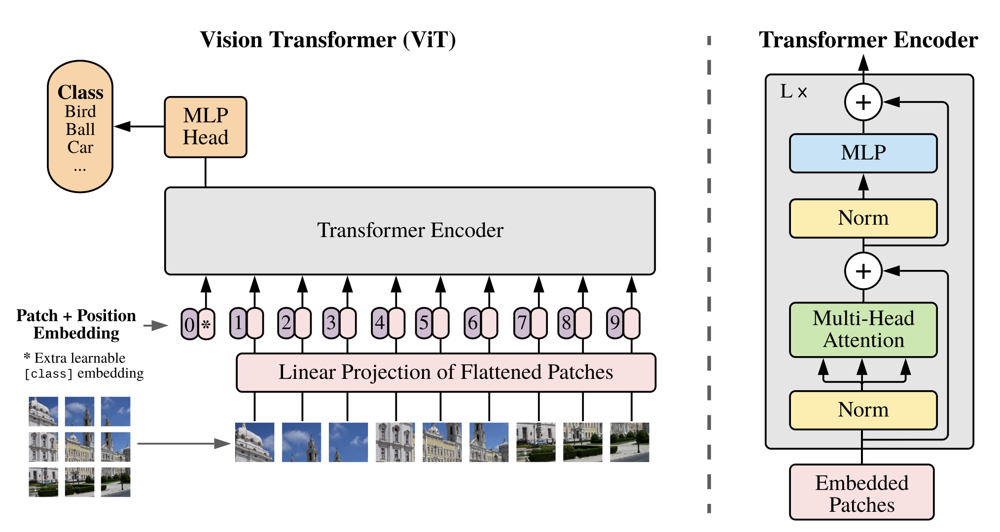
Source: Dosovitskiy et al. [3]

For this project, we selected ViT to compare its performance to CNNs. Since these kinds of models are state-of-the-art in several domains, they are considered as reasonable alternative to well established CNNs such as DenseNet and ResNet.

In contrast to the DenseNet and ResNet, this ViT is pre-trained on ImageNet. In order to adapt it to image classification task based on CheXpert, we change the number of classes from 1000 (ImageNet) to 13 (CheXpert). Additionally, we unfreeze all parameters to enable transfer learning for the whole model.

In the timm library, we can implicitly replace the classification head with a new linear layer by setting the ```num_classes``` parameters to the number of pathologies in our dataset.


In [ ]:
import torch.nn as nn
import torchvision.transforms as T
import torchxrayvision as xrv
import timm

vit_transform = T.Compose([
    xrv.datasets.XRayCenterCrop(),
    xrv.datasets.XRayResizer(224, engine="cv2"),
    T.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1))
])


def pre_trained_vit(pathologies):
    model = timm.create_model(
        "vit_base_patch16_224",
        pretrained=True,
        num_classes=len(pathologies)
    )

    model.pathologies = [p for p in pathologies]

    # ensure all parameters are unfrozen
    for param in model.parameters():
        param.requires_grad_(True)

    return model

Setting XRayResizer engine to cv2 could increase performance.


### ConvNeXt
<b>ConvNext</b> is modern family of convolutional neural networks based on prior experiences with transformer models like ViT. It adpots a simpler design similar to traditional CNNs combined with several key modifications inspired by transformer models, such as LayyerScale and depthwise separable convolutions. These models enable efficiency and effectivness for large-scale image recognition tasks, which makes them suitable as a modern competitor to the ViT in our model. Particularly, we selected the smallest version of the ConvNeXt family.

Analog to ViT, ConvNeXt models are implemented in the timm library and can instantiated as shown below.

In [ ]:
from torch.utils.data import DataLoader
import torchvision.transforms as T
import torchxrayvision as xrv
import torch.nn as nn
import torch.optim as optim
import timm


convnext_transform = T.Compose([
  xrv.datasets.XRayCenterCrop(),
  xrv.datasets.XRayResizer(288, engine="cv2"),
  T.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1)),
])


def pre_trained_convnext(pathologies):
    model = timm.create_model(
        'convnext_tiny.in12k_ft_in1k',
        pretrained=True,
        num_classes=len(pathologies)
    )

    model.pathologies = [p for p in pathologies]

    # ensure all parameters are unfrozen
    for param in model.parameters():
        param.requires_grad_(True)

    return model


Setting XRayResizer engine to cv2 could increase performance.


## Training
In this section, we elaborate on the training process we implemented to adapt and fine-tune the models to the CheXpert image classification task. First, we provide the required training and evaluation functions before we train the models one after each other.

### Training and Evaluation Utilities

#### Load training, validation and test sets
In the beginning, we split the CheXpert dataset in training, validation, and test sets. During the training, the validation set is used to estimate the performance on unseen data without touching the test set. The validation set is also used to select the best version of the model. We implemented an option to select only a random subset of the data by providing the fraction it should contain.

These load the CheXpert dataset, split it according to the input parameters, and create PyTorch ```DataLoader``` objects that can directly used for the subsequent training, validation, and testing.

In [ ]:
from torchxrayvision.datasets import SubsetDataset
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split


# Returns train and validation dataloaders.
def get_train_val_dataloaders(
    transform=None,
    subset_fraction=None,
    val_size=0.2,
    batch_size=64,
    shuffle=True,
):
    dataset = load_chexpert(transform=transform, mode='train', strict=True)

    idxs = np.arange(len(dataset))
    if subset_fraction:
      subset_size = int(len(dataset) * subset_fraction)
      idxs = np.random.choice(idxs, subset_size, replace=False)

    train_idxs, val_idxs = train_test_split(idxs, test_size=val_size, random_state=42)

    # Split dataset into train and validation datasets
    train_dataset = SubsetDataset(dataset, train_idxs)
    val_dataset = SubsetDataset(dataset, val_idxs)

    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle)
    val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=shuffle)

    return train_dataloader, val_dataloader

# Returns test dataloader which loads data from the `val` folder.
def get_test_dataloader(
    transform=None,
    subset_size=None,
    batch_size=64,
    shuffle=False,
):
    dataset = load_chexpert(transform=transform, mode='test')

    idxs = np.arange(len(dataset))
    if subset_size:
        idxs = np.random.choice(idxs, subset_size, replace=False)

    dataset = SubsetDataset(dataset, idxs)
    test_dl = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)

    return test_dl


#### Learning Rate Scheduler

Setting the learning rate complex models such as CNNs or VisionTransformers is not trivial. Therefore, we leverage a <i>Cosine Annealing Schedule</i> with a <i>Linear Warmstart</i> [7] as proposed by Google for their ViT paper [4]. Based on this, we set the parameters according to the model paper in the ViT and ConvNeXt training sections.

To achieve this, we implement a custom LRScheduler as subclass of ```torch.optim.lr_scheduler._LRScheduler```.

In [ ]:
import math
from torch.optim.lr_scheduler import _LRScheduler

class CosineAnnealingWarmstartLR(_LRScheduler):
    def __init__(self, optimizer, T_max, warmup_epochs, eta_min=0.0001, last_epoch=-1):
        self.T_max = T_max
        self.eta_min = eta_min
        self.warmup_epochs = warmup_epochs
        self.eta_min = eta_min
        self.T_cur = last_epoch
        super(CosineAnnealingWarmstartLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        # Linear Warmstart
        if self.last_epoch < self.warmup_epochs:
            return [lr * (self.last_epoch + 1) / self.warmup_epochs for lr in self.base_lrs]
        # Cosine Annealing schedule according to
        # Source: https://pytorch.org/docs/stable/_modules/torch/optim/lr_scheduler.html#CosineAnnealingLR
        else:
            last_epoch = self.last_epoch + 1 - self.warmup_epochs
            t_max = self.T_max - self.warmup_epochs
            return [self.eta_min + (base_lr - self.eta_min) *
                (1 + math.cos(math.pi * last_epoch / t_max)) / 2
                for base_lr in self.base_lrs]


#### Loss Calculation
In the loss calculation, we faced the challenge that a large fraction of labels in the dataset contains at least one <b>NaN</b> value. However, as most of the instances contain at least one NaN value discarding them is not an option. Thus, we have to calculate the loss while still keeping NaN values.

In order to compute the loss for a given batch, we separate the split the calculation in three steps:
1. We mask the NaN values to only keep actual values.
2. We calculate the loss in a pathology-wise fashion.
3. We accumulate the losses of all pathologies.

The detailed computation is shown in the cell below:

In [ ]:
def calculate_loss(y_pred, y_true, criterion, device):
    loss = torch.zeros(1)
    loss = loss.to(device).float()

    # compute loss pathology wise
    for p in range(y_pred.shape[1]):
        # select only pathology across batches
        p_pred, p_true = y_pred[:, p], y_true[:, p]

        # mask NaN values
        mask = ~torch.isnan(p_true)

        p_pred, p_true = p_pred[mask].float(), p_true[mask].float()

        if len(p_true) > 0:
            loss += criterion(p_pred, p_true)

    return loss

#### Model Snapshotting
In order to reproduce the model behavior for different timesteps during training, we store the model weights after each training epoch. Thus, we can select the model based on the validation loss and use the particular set of weights for evaluation and explanation.

In [ ]:
import os

def snapshot(model, epoch, dir="snapshots"):
    snapshot_dir = os.path.join(
        dir,
        model.__class__.__name__,
    )
    os.makedirs(snapshot_dir, exist_ok=True)

    snapshot_path = os.path.join(
        snapshot_dir,
        f"epoch_{epoch + 1}_.pth"
    )

    torch.save(model.state_dict(), snapshot_path)

#### Logging
To make sure that we can also reconstruct the training process including losses per epoch, we store the training statistics of each model in a csv file.

In [ ]:
import pandas as pd

def dump_train_stats(stats, model, dir="snapshots"):
    stats_dir = os.path.join(
        dir,
        model.__class__.__name__,
    )
    os.makedirs(stats_dir, exist_ok=True)

    stats_path = os.path.join(
        stats_dir,
        "train_stats.csv"
    )
    stats.to_csv(stats_path, index=False)
    print(f"Saved train stats to {stats_path}.")

    return stats_path

#### GPU Support
Depending on the operating system and hardware, we try to leverage the GPU for faster gradient computations.

In [ ]:
def get_device():
    # Colab GPU support
    if torch.cuda.is_available():
        print("CUDA available.")
        return torch.device("cuda")

    print("CUDA not available. Using CPU.")
    return torch.device("cpu")

In this section, we define our main training loop. It leverages the previously defined methods and utilities to train a given PyTorch model. In particular, we split the code into blocks of different granularity.

Within each epoch, we first perform one training epoch in which we iterate over the whole dataset by randomly sampling batches of data. Based on these, we calculate the loss, compute the gradients using backpropagation, and ultimately update the model weights. Subsequently, we estimate the models performance by calculating the validation set loss. A snapshot of the current model is saved and the losses are tracked.

In [ ]:
import torch
import torch.functional as F


def get_mode_label(mode):
    return 'Training' if mode == 'train' else 'Validation'

def train_epoch(
    device,
    epoch,
    mode,
    model,
    dataloaders,
    optimizer,
    criterion,
    scheduler=None,
    verbose=False
):
    if mode == "train":
        model.train()
    else:
        model.eval()

    mode_label = get_mode_label(mode)
    dataset_size = len(dataloaders[mode].dataset)
    batch_count = len(dataloaders[mode])

    running_loss = 0.0
    for batch_idx, batch in enumerate(dataloaders[mode]):
        features, labels = batch["img"], batch["lab"]
        features, labels = features.to(device), labels.to(device)

        with torch.set_grad_enabled(mode == "train"):
            predicted = model(features)
            loss = calculate_loss(predicted, labels, criterion, device)

            if mode == "train":
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
            running_loss += loss.item()

            modulo = 20 if mode == "train" else 2
            if verbose and batch_idx % modulo == 0:
                idx = batch_idx + 1
                batch_size = len(features)
                print(f"{mode_label} [{idx*batch_size}/{dataset_size} {(100 * idx/batch_count):.0f}%] Loss: {(running_loss/(idx*batch_size)):.5f}")

    epoch_loss = running_loss / dataset_size
    return epoch_loss

def train(
    model,
    epochs,
    dataloaders,
    optimizer,
    criterion,
    scheduler=None,
    verbose=False
):
    modes = ['train', 'val']
    device = get_device()
    model = model.to(device)
    stats = []

    # Pretty print statements
    print(f"Starting Training for {epochs} Epochs.\n")
    header = " Epoch | Training Loss | Validation Loss | Learning Rate "
    print(len(header) * "-")
    print(header)
    print(len(header) * "-")


    for epoch in range(epochs):
        train_loss = 0
        val_loss = 0
        for mode in modes:
            epoch_loss = train_epoch(
                device,
                epoch,
                mode,
                model,
                dataloaders,
                optimizer,
                criterion,
                scheduler=scheduler,
                verbose=verbose
            )
            if mode == "train":
              train_loss = epoch_loss
            else:
              val_loss = epoch_loss

        if scheduler:
            lr = scheduler.get_last_lr()[0]
        else:
            lr = optimizer.param_groups[0]['lr']

        # Log losses and learning rate
        print(f" {epoch:5d} | {train_loss:13.5f} | {val_loss:15.5f} | {lr:13.5f}")
        # Snapshot model on each epoch
        snapshot(model, epoch)

        stats += [{
            "Epoch": epoch,
            "Training": train_loss,
            "Validation": val_loss,
            "Learning Rate": lr
        }]

        if scheduler:
            scheduler.step()

    print()

    return model, pd.DataFrame(stats)


#### Load Model Snapshot
In order to get the final trained model, we select the epoch with lowest validation loss and load the respective snapshot from the disk.

In [ ]:
import torch
import os
import pandas as pd

def load_model(model, snapshot_dir="snapshots"):
    model_name = model.__class__.__name__

    # load train stats
    train_stats_path = os.path.join(
        snapshot_dir,
        model_name,
        "train_stats.csv"
    )
    train_stats = pd.read_csv(train_stats_path)

    # find best epoch
    best_epoch = train_stats["Validation"].idxmin()
    print(f"Loading best epoch: {best_epoch+1}")

    # load snapshot
    snapshot_path = os.path.join(
        snapshot_dir,
        model_name,
        f"epoch_{best_epoch + 1}_.pth"
    )
    trained_state_dict = torch.load(snapshot_path)

    # update model parameters
    model.load_state_dict(trained_state_dict, strict=True)

    return model, train_stats

#### Visualize Training
After the training, we visualize how the losses and learning rates changed over time.


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


def visualize_train_stats(stats, model):
    stats = stats.loc[:, ["Epoch", "Training", "Validation"]]
    melted_stats = pd.melt(
        stats,
        id_vars=["Epoch"],
        value_vars=["Training", "Validation"],
        var_name="Type",
        value_name="Loss"
    )

    plt.figure(figsize=(10, 6))
    sns.lineplot(data=melted_stats, x="Epoch", y="Loss", hue="Type")

    plt.title(f"{model.__class__.__name__}: Training")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(title="Type")
    plt.show()


def visualize_lr(stats, model):
    stats = stats.loc[:, ["Epoch", "Learning Rate"]]

    plt.figure(figsize=(10, 6))
    sns.lineplot(data=stats, x="Epoch", y="Learning Rate")

    plt.title(f"{model.__class__.__name__}: Learning Rate")
    plt.xlabel("Epoch")
    plt.ylabel("Learning Rate")
    plt.show()

### Train the Models
Using the models introduced in the section above, we now train each of the four models. As the basic steps repeat for each of the models, we explain the process once for DenseNet and only mention difference for the other models if there are any.

During training, we faced the challenge of lacking computational resources to train the models on the full dataset. As we are limited with main memory, GPU memory, and FLOPS, we select a subset of the data to train the ViT and ConvNeXt models. For the pre-trained DenseNet and ResNet, we freeze a large fraction of the backbone and thus are able to train them on the whole dataset.

#### Pre-trained DenseNet
First, we train the pre-trained DenseNet which was already trained on a variety of chest X-ray datasets including CheXpert. As mentioned before, we have to fine-tune both the first convolutional layer as well as the classification head to adapt the model to our dataset.

##### Data Preparation
We set the model hyperparameters according to the DenseNet paper [1]. For the epochs, we set the highest number that we can train in a reasonable time  on Google Colab.

For this model, we select the whole dataset and initiliaze the respective data loaders.

In [ ]:
from torch.utils.data import DataLoader
import torchvision.transforms as T


### CONFIG ###
DENSENET_BATCH_SIZE = 64
DENSENET_EPOCHS = 10
DENSENET_BASE_LR = 3e-3
### CONFIG ###

densenet_train_loader, densenet_val_loader = get_train_val_dataloaders(
    subset_fraction=0.2,
    transform=densenet_transform,
    val_size=0.2,
    batch_size=DENSENET_BATCH_SIZE,
    shuffle=True,
)

##### Model and Training setup
We initialize the model given the pathologies in the CheXpert dataset.

As optimizer we use Adam, an adaptive SGD optimizer using momentum. It is the most commonly used optimizer for many neural networks and was also used by the authors in the DenseNet papers.

As we are calculating the loss on a per-pathology base which is equivalent to binary classification, we select the cross entropy loss.

In [ ]:
import torch.nn as nn
import torch.optim as optim


densenet_model = pre_trained_densenet(
    pathologies=chexpert.pathologies,
)

densenet_optimizer = optim.Adam(
    densenet_model.parameters(),
    lr=DENSENET_BASE_LR
)

densenet_criterion = nn.BCEWithLogitsLoss()

If this fails you can run `wget https://github.com/mlmed/torchxrayvision/releases/download/v1/chex-densenet121-d121-tw-lr001-rot45-tr15-sc15-seed0-best.pt -O /root/.torchxrayvision/models_data/chex-densenet121-d121-tw-lr001-rot45-tr15-sc15-seed0-best.pt`
[██████████████████████████████████████████████████]


##### Training the Model
After we defined all hyperparameters, we run the training of the model and save the training statistics.

In [ ]:
densenet_model, densenet_train_stats = train(
    densenet_model,
    epochs=DENSENET_EPOCHS,
    dataloaders={
        "train": densenet_train_loader,
        "val": densenet_val_loader,
    },
    optimizer=densenet_optimizer,
    criterion=densenet_criterion,
)
densenet_stats_path = dump_train_stats(densenet_train_stats, densenet_model)

CUDA available.
Starting Training for 10 Epochs.

---------------------------------------------------------
 Epoch | Training Loss | Validation Loss | Learning Rate 
---------------------------------------------------------
     0 |       0.08125 |         0.08752 |       0.00300
     1 |       0.07801 |         0.08632 |       0.00300
     2 |       0.07653 |         0.08907 |       0.00300
     3 |       0.07663 |         0.07965 |       0.00300
     4 |       0.07588 |         0.07892 |       0.00300
     5 |       0.07556 |         0.07867 |       0.00300
     6 |       0.07499 |         0.08010 |       0.00300
     7 |       0.07487 |         0.08139 |       0.00300
     8 |       0.07459 |         0.08198 |       0.00300
     9 |       0.07511 |         0.08071 |       0.00300

Saved train stats to snapshots/DenseNet/train_stats.csv.


##### Download Snapshots
This cell is used to download the model snapshots and statistics after the training is done.

In [ ]:
!zip -r -q snapshots.zip /content/snapshots

In [ ]:
from google.colab import files
files.download("snapshots.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### Visualize Training
In this plot, we visualize how the training and validation loss changes over time.

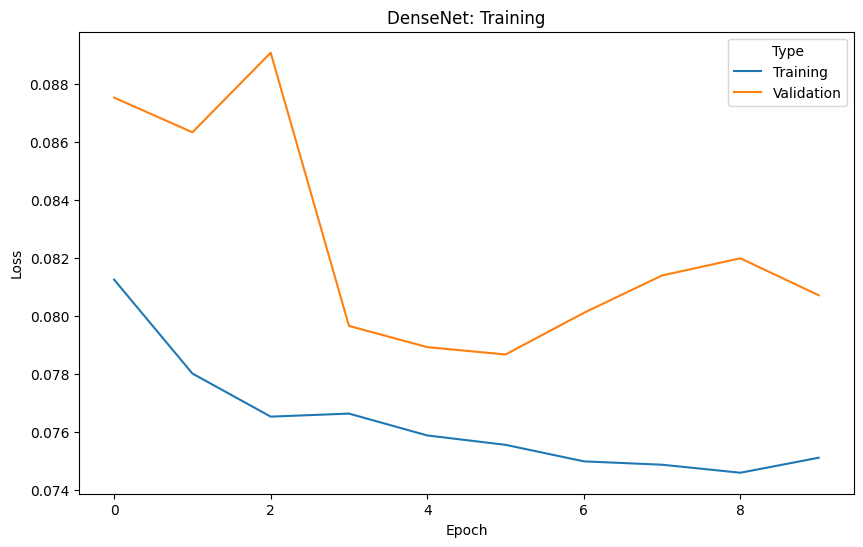

In [ ]:
visualize_train_stats(densenet_train_stats, densenet_model)

#### Pre-trained ResNet
Analog to DenseNet, we perform the training of ResNet. The hyperparameters are set according to this blog post by Sik-Ho Tsang [9].

##### Data Preparation

In [ ]:
from torch.utils.data import DataLoader
import torchvision.transforms as T

# learning rate:
# https://sh-tsang.medium.com/review-resnet-d-bag-of-tricks-for-image-classification-with-convolutional-neural-networks-7ee77669851b#:~:text=Authors%20follow%20ResNet%20to%20choose,to%200.1%C3%97b%2F256.

### CONFIG ###
RESNET_BATCH_SIZE = 64
RESNET_EPOCHS = 10
RESNET_BASE_LR = 0.1 * RESNET_BATCH_SIZE / 256
### CONFIG ###

resnet_train_loader, resnet_val_loader = get_train_val_dataloaders(
    subset_fraction=0.2,
    transform=resnet_transform,
    val_size=0.2,
    batch_size=RESNET_BATCH_SIZE,
    shuffle=True,
)

Setting XRayResizer engine to cv2 could increase performance.


##### Model and Training setup

In [ ]:
import torch.nn as nn
import torch.optim as optim


resnet_model = pre_trained_resnet(
    pathologies=resnet_train_loader.dataset.pathologies,
)

resnet_optimizer = optim.Adam(
    resnet_model.parameters(),
    lr=RESNET_BASE_LR
)

resnet_criterion = nn.BCEWithLogitsLoss()

##### Training the Model

In [ ]:
resnet_model, resnet_train_stats = train(
    resnet_model,
    epochs=RESNET_EPOCHS,
    dataloaders={
        "train": resnet_train_loader,
        "val": resnet_val_loader,
    },
    optimizer=resnet_optimizer,
    criterion=resnet_criterion
)
resnet_stats_path = dump_train_stats(resnet_train_stats, resnet_model)

CUDA available.
Starting Training for 10 Epochs.

---------------------------------------------------------
 Epoch | Training Loss | Validation Loss | Learning Rate 
---------------------------------------------------------
     0 |       0.08315 |         0.08132 |       0.02500
     1 |       0.07929 |         0.08322 |       0.02500
     2 |       0.07775 |         0.08569 |       0.02500
     3 |       0.07804 |         0.08340 |       0.02500
     4 |       0.07682 |         0.08181 |       0.02500
     5 |       0.07755 |         0.08106 |       0.02500
     6 |       0.07706 |         0.08189 |       0.02500
     7 |       0.07671 |         0.08026 |       0.02500
     8 |       0.07672 |         0.08298 |       0.02500
     9 |       0.07719 |         0.08127 |       0.02500

Saved train stats to snapshots/ResNet/train_stats.csv.


##### Download Snapshots

In [ ]:
!zip -r -q snapshots.zip /content/snapshots

In [ ]:
from google.colab import files
files.download("snapshots.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### Visualize Training


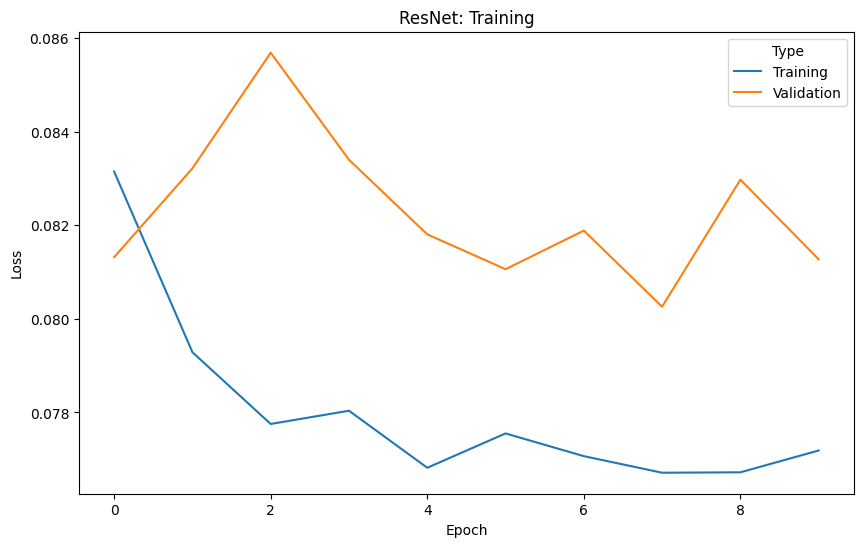

In [ ]:
visualize_train_stats(resnet_train_stats, resnet_model)

#### VisionTransformer

##### Data Preparation

In [ ]:
from torch.utils.data import DataLoader
import torchvision.transforms as T


vit_train_loader, vit_val_loader = get_train_val_dataloaders(
    subset_fraction=0.2,
    transform=vit_transform,
    val_size=0.2,
    batch_size=64,
    shuffle=True,
)

##### Model and Training setup
We set the learning rate according to the ViT paper [3].

In [ ]:
import torch.nn as nn
import torch.optim as optim

### CONFIG ###
VIT_EPOCHS = 10

VIT_BASE_LR = 0.03
VIT_WARMUP_EPOCHS = 2
### CONFIG ###

vit_model = pre_trained_vit(
    pathologies=vit_train_loader.dataset.pathologies,
)

vit_optimizer = optim.Adam(
    vit_model.parameters(),
    lr=VIT_BASE_LR
)

vit_scheduler = CosineAnnealingWarmstartLR(
    vit_optimizer,
    VIT_EPOCHS,
    VIT_WARMUP_EPOCHS
)

vit_criterion = nn.BCEWithLogitsLoss()

##### Training the Model

In [ ]:
vit_model, vit_train_stats = train(
    vit_model,
    epochs=VIT_EPOCHS,
    dataloaders={
        "train": vit_train_loader,
        "val": vit_val_loader,
    },
    optimizer=vit_optimizer,
    criterion=vit_criterion,
    scheduler=vit_scheduler
)
vit_stats_path = dump_train_stats(vit_train_stats, vit_model)

CUDA available.
Starting Training for 10 Epochs.

---------------------------------------------------------
 Epoch | Training Loss | Validation Loss | Learning Rate 
---------------------------------------------------------
     0 |       0.16949 |         0.11287 |       0.01500
     1 |       0.11408 |         0.11478 |       0.03000
     2 |       0.11267 |         0.11178 |       0.02886
     3 |       0.11199 |         0.11310 |       0.02562
     4 |       0.11169 |         0.11140 |       0.02077
     5 |       0.11164 |         0.11090 |       0.01505
     6 |       0.11113 |         0.11211 |       0.00933
     7 |       0.11099 |         0.11087 |       0.00448
     8 |       0.11101 |         0.11157 |       0.00124
     9 |       0.11095 |         0.11111 |       0.00010

Saved train stats to snapshots/VisionTransformer/train_stats.csv.


##### Download Snapshots

In [ ]:
!zip -r -q snapshots.zip /content/snapshots

In [ ]:
from google.colab import files
files.download("snapshots.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### Visualize Training


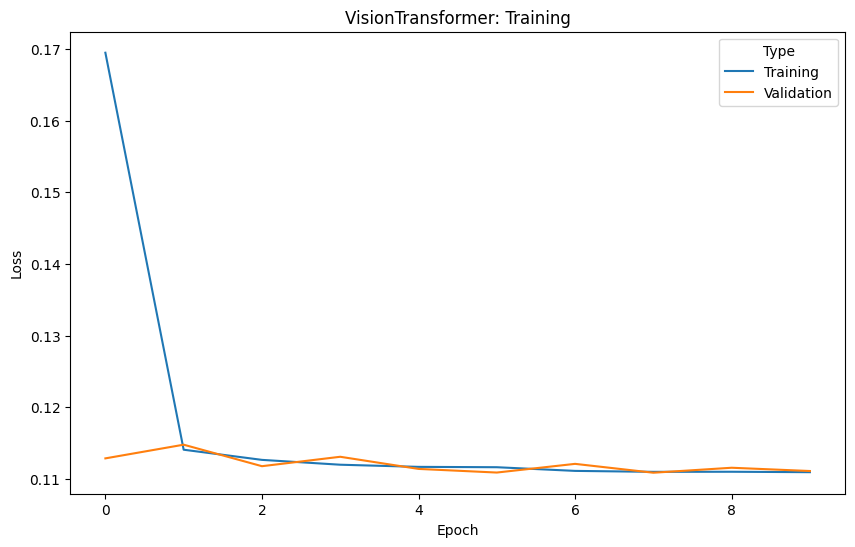

In [ ]:
visualize_train_stats(vit_train_stats, vit_model)

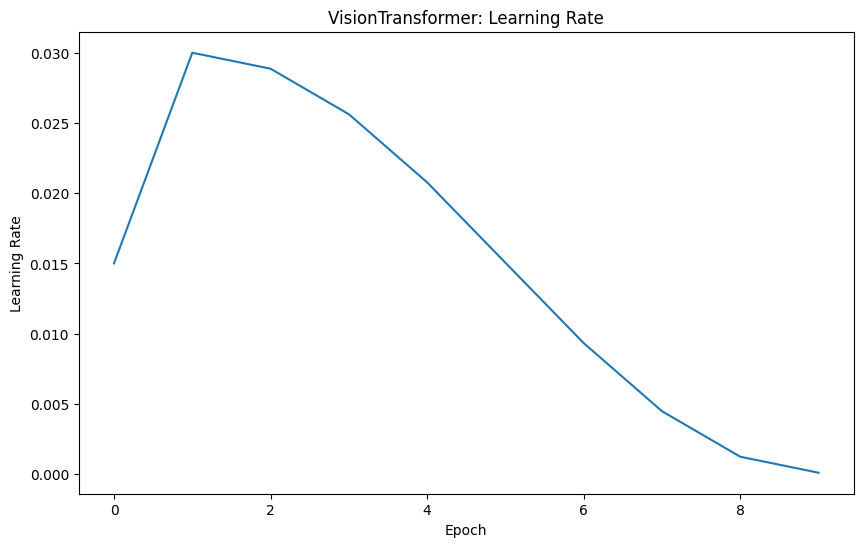

In [ ]:
visualize_lr(vit_train_stats, vit_model)

#### ConvNeXt

##### Data Preparation

In [ ]:
convnext_train_loader, convnext_val_loader = get_train_val_dataloaders(
    subset_fraction=0.2,
    transform=convnext_transform,
    val_size=0.2,
    batch_size=64,
    shuffle=True,
)

Setting XRayResizer engine to cv2 could increase performance.


##### Model and Training setup
We set the learning rate according to the ConvNeXt paper [4].

In [ ]:
### CONFIG ###
CONVNEXT_EPOCHS = 10

CONVNEXT_BASE_LR = 4e-3
CONVNEXT_WARMUP_EPOCHS = 2
### CONFIG ###

convnext_model = pre_trained_convnext(
    pathologies=convnext_train_loader.dataset.pathologies,
)

convnext_optimizer = optim.Adam(
    convnext_model.parameters(),
    lr=CONVNEXT_BASE_LR
)

convnext_scheduler = CosineAnnealingWarmstartLR(
    convnext_optimizer,
    CONVNEXT_EPOCHS,
    CONVNEXT_WARMUP_EPOCHS
)

convnext_criterion = nn.BCEWithLogitsLoss()

['Atelectasis',
 'Cardiomegaly',
 'Consolidation',
 'Edema',
 'Enlarged Cardiomediastinum',
 'Fracture',
 'Lung Lesion',
 'Lung Opacity',
 'Effusion',
 'Pleural Other',
 'Pneumonia',
 'Pneumothorax',
 'Support Devices']

##### Training the Model

In [ ]:
convnext_model, convnext_train_stats = train(
    model=convnext_model,
    epochs=CONVNEXT_EPOCHS,
    dataloaders={
        "train": convnext_train_loader,
        "val": convnext_val_loader,
    },
    optimizer=convnext_optimizer,
    criterion=convnext_criterion,
    scheduler=convnext_scheduler,
)
convnext_stats_path = dump_train_stats(convnext_train_stats, convnext_model)

CUDA available.
Starting Training for 10 Epochs.

---------------------------------------------------------
 Epoch | Training Loss | Validation Loss | Learning Rate 
---------------------------------------------------------
     0 |       0.11472 |         0.11356 |       0.00200
     1 |       0.11189 |         0.11165 |       0.00400
     2 |       0.11334 |         0.11147 |       0.00385
     3 |       0.11128 |         0.11125 |       0.00343
     4 |       0.11113 |         0.11144 |       0.00280
     5 |       0.11110 |         0.11045 |       0.00205
     6 |       0.11102 |         0.11115 |       0.00130
     7 |       0.11097 |         0.11090 |       0.00067
     8 |       0.11101 |         0.11159 |       0.00025
     9 |       0.11098 |         0.11114 |       0.00010

Saved train stats to snapshots/ConvNeXt/train_stats.csv.


##### Download Snapshots

In [ ]:
!zip -r -q snapshots.zip /content/snapshots

In [ ]:
from google.colab import files
files.download("snapshots.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### Visualize Training


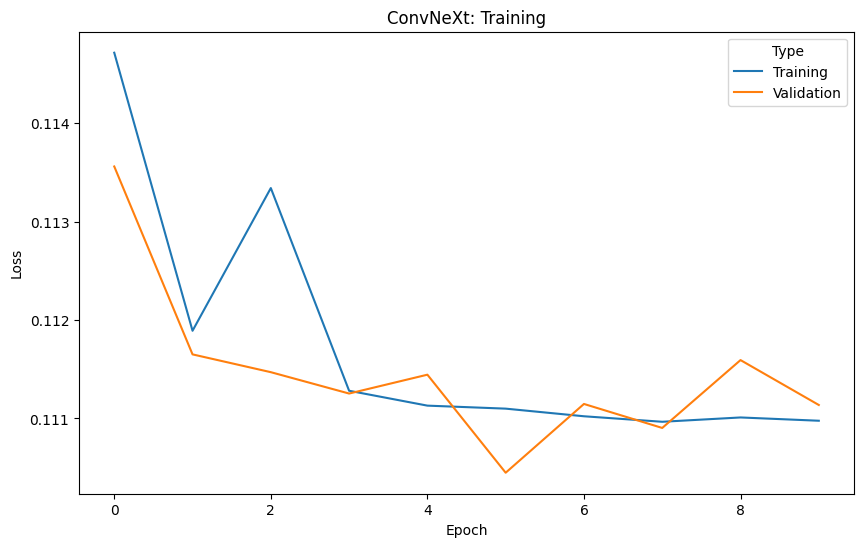

In [ ]:
visualize_train_stats(convnext_train_stats, convnext_model)

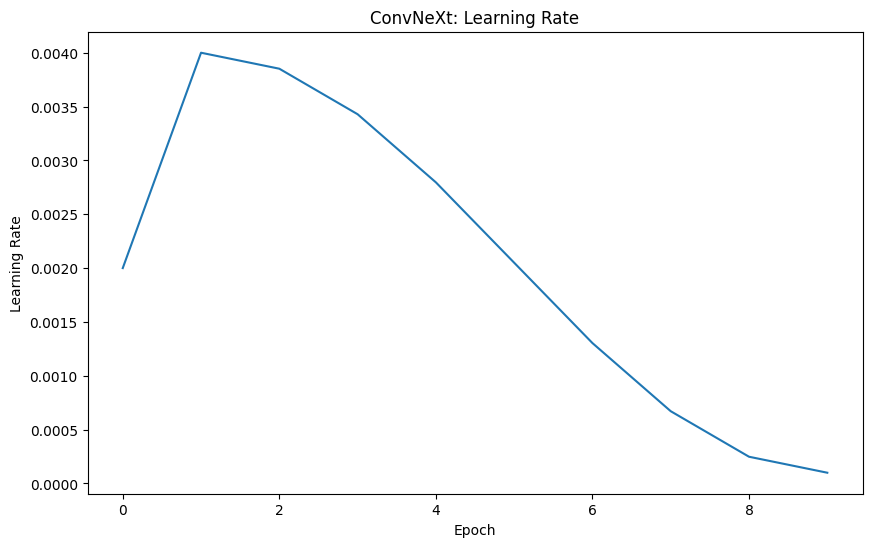

In [ ]:
visualize_lr(convnext_train_stats, convnext_model)

## Load Model Snapshots
During training, we store a snapshot of the current model within each epoch. Once the training is finished, we load best model w.r.t. the validation loss and use it for the evaluation and explanation parts. In this section, we load the training statistics and snapshots to load the best weights for each model.

### Download Snapshots from Google Drive
We store all snapshots in a zip-file in Google Drive. The folder structure is as follows:
- snapshots.zip
    - DenseNet
        - train_stats.csv
        - epoch_6.pth
    - ResNet
        - train_stats.csv
        - epoch_8.pth
    - VisionTransformer
        - train_stats.csv
        - epoch_8.pth
    - ConvNeXt
        - train_stats.csv
        - epoch_6.pth

In [ ]:
import gdown
url = "https://drive.google.com/file/d/1qNHj1K9WSeSAONuzTncfL1pOlodVZO5s/view?usp=sharing"
gdown.download(url=url, output="snapshots.zip", quiet=False, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=121gvPlugp2Ia3VvYlQiK7T6R8rxf8lhW
To: /content/snapshots.zip
100%|██████████| 49.9k/49.9k [00:00<00:00, 13.5MB/s]


'snapshots.zip'

In [ ]:
!unzip -q snapshots.zip -d /content/snapshots

### DenseNet

In [ ]:
densenet_model = pre_trained_densenet(
    pathologies=chexpert.pathologies,
)
densenet_model, densenet_train_stats = load_model(densenet_model)

### ResNet

In [ ]:
resnet_model = pre_trained_resnet(
    pathologies=chexpert.pathologies,
)

resnet_model, resnet_train_stats = load_model(resnet_model)

### VisionTransformer

In [ ]:
vit_model = pre_trained_vit(
    pathologies=chexpert.pathologies,
)

vit_model, vit_train_stats = load_model(vit_model)

### ConvNeXt

In [ ]:
convnext_model = pre_trained_convnext(
    pathologies=chexpert.pathologies,
)

convnext_model, convnext_train_stats = load_model(convnext_model)

# Results

- table with metrics and models, compare number of SOTA, chexpert
- we can't compete to chexpert because they trained on 400GB (original) dataset
- beautiful visualizations

## Evaluation

### Evaluation Utilities

#### Evaluation Function
This function evaluates a model based on a given data loader.

Challenges:
As the pre-trained models in torchxrayvision return a prediction for 18 diseases which are not entirely consistens with the ones present in our dataset, we have to handle their outputs accordingly.

In particular, we perform the evaluation only on the intersection of pathologies that are present both in the dataset in the model.


In [ ]:
import sklearn.metrics as m
import torch


def evaluate_model(model, data_loader, avg="weighted"):
    # Colab GPU support
    device = get_device()
    model = model.to(device)

    model.eval()

    y_true_all = torch.tensor([]).to(device)
    y_pred_all = torch.tensor([]).to(device)

    with torch.no_grad():
        for batch in data_loader:
            X = batch["img"]
            y_true = batch["lab"]
            X, y_true = X.to(device), y_true.to(device)

            y_pred = model(X)

            y_true_all = torch.cat((y_true_all, y_true), dim=0)
            y_pred_all = torch.cat((y_pred_all, y_pred), dim=0)

    y_true_all = y_true_all.cpu().numpy()
    y_pred_all = y_pred_all.cpu().numpy()
    y_pred_all_tresh = (y_pred_all > 0.5).astype(float)

    nan_mask = ~np.isnan(y_true_all)

    # Calculate class wise metrics
    auc_scores = []
    acc_scores = []
    precisions = []
    recalls = []
    f1_scores = []
    for i in range(y_true.shape[1]):
        # only compute score if class contains values
        if np.any(nan_mask[:, i]):
            y_true = y_true_all[nan_mask[:, i], i]
            y_pred = y_pred_all[nan_mask[:, i], i]
            y_pred_thresh = y_pred_all_tresh[nan_mask[:, i], i]

            # AUC
            try:
                auc = m.roc_auc_score(y_true, y_pred)
                auc_scores += [auc]
            except:
                auc_scores += [np.nan]

            acc_scores += [m.accuracy_score(y_true, y_pred_thresh)]
            precisions += [m.precision_score(y_true, y_pred_thresh, average=avg)]
            recalls += [m.recall_score(y_true, y_pred_thresh, average=avg)]
            f1_scores += [m.f1_score(y_true, y_pred_thresh, average=avg)]
        else:
            auc_scores += [np.nan]
            acc_scores += [np.nan]
            precisions += [np.nan]
            recalls += [np.nan]
            f1_scores += [np.nan]

    # mask and flatten outputs and targets for all other metrics
    y_true_all = y_true_all[nan_mask].flatten()
    y_pred_all_tresh = y_pred_all_tresh[nan_mask].flatten()

    total_accuracy = m.accuracy_score(y_true_all, y_pred_all_tresh)
    total_precision = m.precision_score(y_true_all, y_pred_all_tresh, average=avg)
    total_recall = m.recall_score(y_true_all, y_pred_all_tresh, average=avg)
    total_f1 = m.f1_score(y_true_all, y_pred_all_tresh, average=avg)

    return {
        "pathologies": model.pathologies,
        "total_auc": np.mean(np.nan_to_num(auc_scores, nan=0)),
        "total_accuracy": total_accuracy,
        "total_precision": total_precision,
        "total_recall": total_recall,
        "total_f1": total_f1,
        "auc_scores": auc_scores,
        "acc_scores": acc_scores,
        "precisions": precisions,
        "recalls": recalls,
        "f1_scores": f1_scores
    }

#### Visualize Metrics

In [ ]:
# Bar plots

def visualize_metrics(metrics):
    # Extract the metrics
    precision = metrics['precision']
    recall = metrics['recall']
    f1 = metrics['f1']
    auc = metrics['auc']

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(8, 6))

    # Metrics to plot
    metric_values = [precision, recall, f1, auc]
    metric_names = ['Precision', 'Recall', 'F1 Score', 'AUC']

    # Colors for each bar
    colors = ['skyblue', 'salmon', 'lightgreen', 'violet']

    # Plot a bar chart
    ax.bar(metric_names, metric_values, color=colors)

    # Annotate each bar with the value
    for i, value in enumerate(metric_values):
        ax.text(i, value, f'{value:.2f}', ha='center', va='bottom', fontweight='light')

    # Set title and labels
    ax.set_title('Model Performance Metrics')
    ax.set_ylim(0, 1)  # Assuming the metric values are between 0 and 1

    # Show the plot
    plt.tight_layout()
    plt.show()


def visualize_combined_metrics(models_list, metrics_list):
    # Ensure we have 4 or fewer models
    if len(models_metrics) > 4:
        raise ValueError("This function supports visualization for up to 4 models only.")

    # Create a list for each metric
    precision = [metrics['precision'] for metrics in models_metrics.values()]
    recall = [metrics['recall'] for metrics in models_metrics.values()]
    f1 = [metrics['f1'] for metrics in models_metrics.values()]
    auc = [metrics['auc'] for metrics in models_metrics.values()]

    # Number of bars for each group
    n_bars = len(models_metrics)

    # The x position of bars
    bar_positions = np.arange(n_bars)

    # Set up the matplotlib figure
    fig, ax = plt.subplots(figsize=(10, 6))

    # Width of a bar
    bar_width = 0.2

    # Set the position of bar on X axis
    r1 = np.arange(len(precision))
    r2 = [x + bar_width for x in r1]
    r3 = [x + bar_width for x in r2]
    r4 = [x + bar_width for x in r3]

    colors = ['skyblue', 'salmon', 'lightgreen', 'violet']

    # Make the plot
    ax.bar(r1, precision, color='skyblue', width=bar_width, edgecolor='grey', label='Precision')
    ax.bar(r2, recall, color='salmon', width=bar_width, edgecolor='grey', label='Recall')
    ax.bar(r3, f1, color='lightgreen', width=bar_width, edgecolor='grey', label='F1 Score')
    ax.bar(r4, auc, color='violet', width=bar_width, edgecolor='grey', label='AUC')

    # Add labels for the x tick labels
    model_names = list(models_metrics.keys())
    ax.set_xlabel('Models', fontweight='bold')
    ax.set_xticks([r + bar_width for r in range(len(precision))])
    ax.set_xticklabels(model_names)

    # Create legend & Show graphic
    ax.legend()
    plt.show()

In [ ]:
# Radar plot

def visualize_metrics_radar_chart(metrics):
    labels = np.array(['Precision', 'Recall', 'F1', 'AUC'])
    stats = np.array(list(metrics.values()))

    # Number of variables we're plotting.
    num_vars = len(labels)

    # Compute angle for each axis
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats = np.concatenate((stats, [stats[0]]))  # Repeat the first value to close the circle
    angles += angles[:1]  # Ensure the loop is closed by repeating the first value

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

    # Draw the polygon representing the values
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)

    # Draw the labels for each angle
    ax.set_thetagrids(np.degrees(angles[:-1]), labels)

    # Add some labels
    ax.set_title('Model Performance Metrics')

    plt.show()



def visualize_multiple_metrics_radar_chart(models_metrics):
    # Set up the radar chart axes
    metrics = ['Precision', 'Recall', 'F1', 'AUC']
    num_metrics = len(metrics)
    angles = np.linspace(0, 2 * np.pi, num_metrics, endpoint=False).tolist()
    angles += angles[:1]  # Complete the loop

    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

    # Draw one axis per variable + add labels
    plt.xticks(angles[:-1], metrics)

    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([0.2, 0.4, 0.6, 0.8], ["0.2", "0.4", "0.6", "0.8"], color="grey", size=12)
    plt.ylim(0, 1)

    # Plot each model's performance
    for model_name, model_metrics in models_metrics.items():
        stats = np.array(list(model_metrics.values()))
        stats = np.concatenate((stats, [stats[0]]))  # Complete the loop
        ax.plot(angles, stats, linewidth=2, linestyle='solid', label=model_name)
        ax.fill(angles, stats, alpha=0.25)

    # Add legend
    plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    plt.show()


In [ ]:
# Confusion matrices
def plot_confusion_matrices(cm_array, pathologies):
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))  # Adjust the subplot grid if necessary
    axes = axes.flatten()  # Flatten the grid for easy iteration

    for i, cm in enumerate(cm_array):
        sns.heatmap(cm, annot=True, fmt='d', ax=axes[i], cbar=False, cmap='Blues')
        axes[i].set_title(pathologies[i])
        axes[i].set_xlabel('Predicted')
        axes[i].set_ylabel('Actual')

    # Remove the empty subplots if the number of pathologies is less than the subplot grid
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.tight_layout()
    plt.show()

In [ ]:
def visualize_metrics_comparison(models_metrics):
    # Extract the metrics for each model
    labels = list(models_metrics.keys())

    auc_values = [model['total_auc'] for model in models_metrics.values()]
    accuracy_values = [model['total_accuracy'] for model in models_metrics.values()]
    f1_values = [model['total_f1'] for model in models_metrics.values()]

    # Set the width of the bars and calculate their positions
    bar_width = 0.2
    n_models = len(models_metrics)
    index = np.arange(n_models)

    # Set up the matplotlib figure and axes
    fig, ax = plt.subplots(figsize=(12, 6))

    # Create bars for AUC
    auc_bars = ax.bar(index - bar_width, auc_values, bar_width, label='AUC', color='skyblue')

    # Create bars for accuracy on the same axis
    acc_bars = ax.bar(index, accuracy_values, bar_width, label='Accuracy', color='lightgreen')

    # Create bars for F1 score on the same axis
    f1_bars = ax.bar(index + bar_width, f1_values, bar_width, label='F1 Score', color='salmon')

    # Labeling and visual adjustments
    ax.set_xlabel('Models')
    ax.set_ylabel('Scores')
    ax.set_title('Model Performance Comparison')
    ax.set_xticks(index)
    ax.set_xticklabels(labels)
    ax.legend()

    # Annotate the bars with the data values
    for bars in [auc_bars, acc_bars, f1_bars]:
        for bar in bars:
            yval = bar.get_height()
            ax.annotate(f'{yval:.2f}',
                        xy=(bar.get_x() + bar.get_width() / 2, yval),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    # Remove every odd y-tick from the AUC side
    yticks = ax.get_yticks()
    ax.set_yticks(yticks[::2])  # Select every other tick

    plt.show()

In [ ]:
def metrics_summary(metrics, metric_name):
  return list(zip(metrics['pathologies'], metrics[metric_name]))

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def _plot(freq_list):
    # Extract labels and values for the first frequency in the list
    labels, _ = zip(*freq_list[0])
    num_freqs = len(freq_list)

    # Set up positions for the bar groups
    x = np.arange(len(labels))
    width = 0.2  # Adjust the width of each bar

    # Create the bar chart
    fig, ax = plt.subplots()

    for i, freq in enumerate(freq_list):
        values = [v for _, v in freq]
        ax.bar(x + i * width, values, width, label=f'Frequency {i + 1}')

    # Add labels, title
    ax.set_ylabel('Frequency')
    ax.set_title('Frequency of Conditions')
    ax.set_xticks(x + (width * (num_freqs - 1)) / 2)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    # Display the plot
    plt.tight_layout()
    plt.show()



In [ ]:
# Function to generate heatmaps of permance metrics of each of the models

def visualise_heatmaps(metrics):
    cols = ['pathologies','auc_scores','acc_scores','precisions','recalls','f1_scores']
    dfs = [(model, pd.DataFrame(metrics[model])[cols].set_index('pathologies')) for model in metrics]

    # Set up a 2x2 grid of subplots
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(16, 12), gridspec_kw={'wspace': 0.15, 'hspace': 0.15})

    # Create heatmaps without colorbars for individual plots
    sns.heatmap(dfs[0][1], annot=True, fmt=".2f", cmap="Blues", ax=axes[0, 0], cbar=False)
    axes[0, 0].set_title(dfs[0][0])
    sns.heatmap(dfs[1][1], annot=True, fmt=".2f", cmap="Blues", ax=axes[0, 1], cbar=False)
    axes[0, 1].set_title(dfs[1][0])
    sns.heatmap(dfs[2][1], annot=True, fmt=".2f", cmap="Blues", ax=axes[1, 0], cbar=False)
    axes[1, 0].set_title(dfs[2][0])
    sns.heatmap(dfs[3][1], annot=True, fmt=".2f", cmap="Blues", ax=axes[1, 1], cbar=False)
    axes[1, 1].set_title(dfs[3][0])

    # Remove unnecessary labels and tick labels
    axes[0, 1].set_ylabel(''); axes[0, 1].set_yticklabels([])
    axes[1, 1].set_ylabel(''); axes[1, 1].set_yticklabels([])
    axes[0, 0].set_xlabel(''); axes[0, 0].set_xticklabels([])
    axes[0, 1].set_xlabel(''); axes[0, 1].set_xticklabels([])

    # Add a colorbar in the third column of the first row
    cbar_ax = fig.add_axes([0.7, 0.3, 0.015, 0.4])  # x-position, y-position, width, height
    plt.colorbar(axes[0, 0].collections[0], cax=cbar_ax)

    # Hide the empty subplot in the third column of the second row
    axes[0, 2].set_visible(False)
    axes[1, 2].set_visible(False)

    plt.show()

In [ ]:
def pretty_stats(metrics):
    print(
        f"{'Pathology':<26} | {'AUC':<6} | {'ACC':<6} | {'Prec':<6} | {'Recall':<6} | {'F1':<6}"
    )
    print("-" * 71)
    for i, label in enumerate(metrics["pathologies"]):
        auc = metrics['auc_scores'][i]
        if np.isnan(auc): auc = 0.0
        acc = metrics['acc_scores'][i]
        prec = metrics['precisions'][i]
        recall = metrics['recalls'][i]
        f1 = metrics['f1_scores'][i]
        print(
            f"{label:<26} | {auc:.4f} | {acc:.4f} | {prec:.4f} | {recall:.4f} | {f1:.4f}"
        )

In [ ]:
##### Function for Metrics Comparison

### Model Evaluation

#### Pre-trained DenseNet

In [ ]:
import torchvision.transforms as T

densenet_test_loader = get_test_dataloader(
    transform=densenet_transform,
    batch_size=64,
    shuffle=False,
)

densenet_metrics = evaluate_model(
    densenet_model,
    densenet_test_loader,
)
pretty_stats(densenet_metrics)

CUDA available.
Pathology                  | AUC    | ACC    | Prec   | Recall | F1    
-----------------------------------------------------------------------
Atelectasis                | 0.8192 | 0.7030 | 0.7663 | 0.7030 | 0.7065
Cardiomegaly               | 0.8072 | 0.7673 | 0.7611 | 0.7673 | 0.7625
Consolidation              | 0.8989 | 0.8069 | 0.8490 | 0.8069 | 0.8221
Edema                      | 0.8423 | 0.7871 | 0.8317 | 0.7871 | 0.8009
Enlarged Cardiomediastinum | 0.8527 | 0.5891 | 0.7101 | 0.5891 | 0.5323
Fracture                   | 0.0000 | 0.9257 | 1.0000 | 0.9257 | 0.9614
Lung Lesion                | 0.2189 | 0.8812 | 0.9895 | 0.8812 | 0.9322
Lung Opacity               | 0.8602 | 0.7822 | 0.7816 | 0.7822 | 0.7818
Effusion                   | 0.8390 | 0.7426 | 0.7834 | 0.7426 | 0.7509
Pleural Other              | 0.9602 | 0.9901 | 0.9901 | 0.9901 | 0.9901
Pneumonia                  | 0.9220 | 0.9158 | 0.9360 | 0.9158 | 0.9253
Pneumothorax               | 0.8308 | 0.9554 | 0

#### Pre-trained ResNet

In [ ]:
resnet_test_loader = get_test_dataloader(
    transform=resnet_transform,
    batch_size=64,
    shuffle=False,
)

# resnet_model = pretrained_resnet()
resnet_metrics = evaluate_model(resnet_model, resnet_test_loader)
pretty_stats(resnet_metrics)

CUDA available.
Pathology                  | AUC    | ACC    | Prec   | Recall | F1    
-----------------------------------------------------------------------
Atelectasis                | 0.8302 | 0.6832 | 0.7871 | 0.6832 | 0.6823
Cardiomegaly               | 0.8363 | 0.7723 | 0.7660 | 0.7723 | 0.7580
Consolidation              | 0.8790 | 0.8267 | 0.8565 | 0.8267 | 0.8379
Edema                      | 0.8771 | 0.8119 | 0.8472 | 0.8119 | 0.8229
Enlarged Cardiomediastinum | 0.8507 | 0.4950 | 0.5804 | 0.4950 | 0.3660
Fracture                   | 0.0000 | 0.7673 | 1.0000 | 0.7673 | 0.8683
Lung Lesion                | 0.6716 | 0.9010 | 0.9896 | 0.9010 | 0.9432
Lung Opacity               | 0.8841 | 0.7723 | 0.8018 | 0.7723 | 0.7569
Effusion                   | 0.8562 | 0.7574 | 0.8091 | 0.7574 | 0.7657
Pleural Other              | 0.9254 | 0.9752 | 0.9900 | 0.9752 | 0.9826
Pneumonia                  | 0.7848 | 0.9158 | 0.9206 | 0.9158 | 0.9182
Pneumothorax               | 0.6608 | 0.9010 | 0

#### VisionTransformer

In [ ]:
vit_test_loader = get_test_dataloader(
    transform=vit_transform,
    batch_size=64,
    shuffle=False,
)

vit_metrics = evaluate_model(
    vit_model,
    vit_test_loader,
)
pretty_stats(vit_metrics)

CUDA available.
Pathology                  | AUC    | ACC    | Prec   | Recall | F1    
-----------------------------------------------------------------------
Atelectasis                | 0.5399 | 0.3713 | 0.1379 | 0.3713 | 0.2011
Cardiomegaly               | 0.5639 | 0.6733 | 0.4533 | 0.6733 | 0.5418
Consolidation              | 0.6454 | 0.8416 | 0.7083 | 0.8416 | 0.7692
Edema                      | 0.5449 | 0.2079 | 0.0432 | 0.2079 | 0.0716
Enlarged Cardiomediastinum | 0.5958 | 0.4802 | 0.2306 | 0.4802 | 0.3116
Fracture                   | 0.0000 | 1.0000 | 1.0000 | 1.0000 | 1.0000
Lung Lesion                | 0.4179 | 0.9950 | 0.9901 | 0.9950 | 0.9926
Lung Opacity               | 0.4448 | 0.5792 | 0.3355 | 0.5792 | 0.4249
Effusion                   | 0.5623 | 0.3168 | 0.1004 | 0.3168 | 0.1525
Pleural Other              | 0.1343 | 0.9950 | 0.9901 | 0.9950 | 0.9926
Pneumonia                  | 0.5277 | 0.9604 | 0.9224 | 0.9604 | 0.9410
Pneumothorax               | 0.4520 | 0.9653 | 0

#### ConvNeXt

In [ ]:
convnext_test_loader = get_test_dataloader(
    transform=convnext_transform,
    batch_size=64,
    shuffle=False,
)

convnext_metrics = evaluate_model(
    convnext_model,
    convnext_test_loader,
)
pretty_stats(convnext_metrics)

CUDA available.
Pathology                  | AUC    | ACC    | Prec   | Recall | F1    
-----------------------------------------------------------------------
Atelectasis                | 0.4629 | 0.3713 | 0.1379 | 0.3713 | 0.2011
Cardiomegaly               | 0.4460 | 0.6733 | 0.4533 | 0.6733 | 0.5418
Consolidation              | 0.6493 | 0.8416 | 0.7083 | 0.8416 | 0.7692
Edema                      | 0.4789 | 0.2079 | 0.0432 | 0.2079 | 0.0716
Enlarged Cardiomediastinum | 0.5486 | 0.4802 | 0.2306 | 0.4802 | 0.3116
Fracture                   | 0.0000 | 1.0000 | 1.0000 | 1.0000 | 1.0000
Lung Lesion                | 0.8657 | 0.9950 | 0.9901 | 0.9950 | 0.9926
Lung Opacity               | 0.4986 | 0.5792 | 0.3355 | 0.5792 | 0.4249
Effusion                   | 0.4510 | 0.3168 | 0.1004 | 0.3168 | 0.1525
Pleural Other              | 0.5100 | 0.9950 | 0.9901 | 0.9950 | 0.9926
Pneumonia                  | 0.6830 | 0.9604 | 0.9224 | 0.9604 | 0.9410
Pneumothorax               | 0.5172 | 0.9653 | 0

### Visualise Metrics

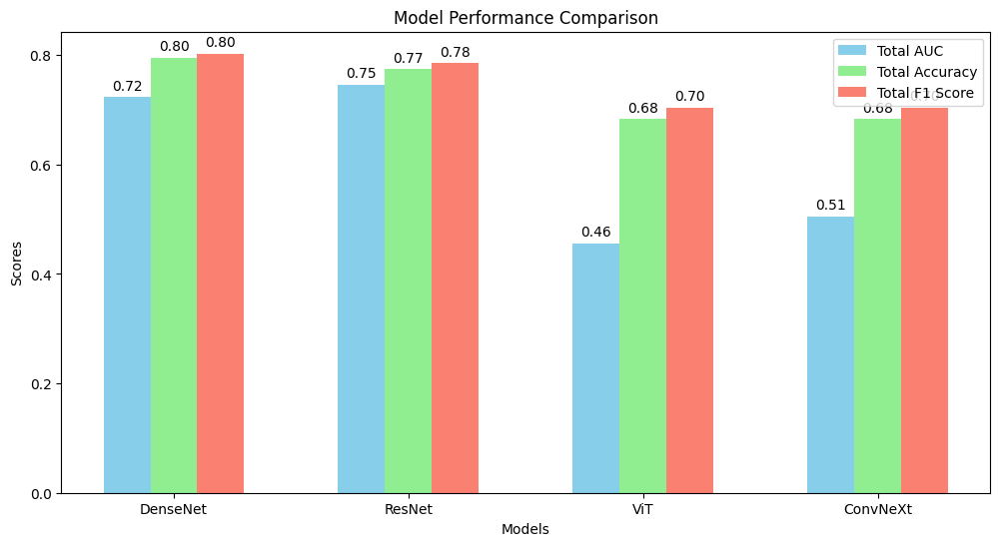

In [ ]:
metrics = {
    'DenseNet': densenet_metrics,
    'ResNet': resnet_metrics,
    'ViT': vit_metrics,
    'ConvNeXt': convnext_metrics,
}
metric_name = ['total_auc', 'total_accuracy', 'total_f1']

_map = {}
for name, metrics in metrics.items():
    _map[name] = {}
    for mn in metric_name:
        _map[name][mn] = metrics[mn]

visualize_metrics_comparison(_map)

The bar chart compares the four machine learning models:

- DenseNet
- ResNet
- ViT (Vision Transformer)
- ConvNeXt

Based on three performance metrics:
- AUC (Area Under the Curve)
- Accuracy
- F1 Score:

### **General Performance**
**DenseNet:** This model shows the highest consistency across all three metrics, suggesting it is well-tuned for the task.

**ResNet:** Close to DenseNet in AUC and F1 Score but slightly less in Accuracy, which might indicate it is slightly less consistent in correctly classifying all classes.

**ViT:** It has lower scores in all metrics compared to DenseNet and ResNet, hinting at potential difficulties in extracting features from the chest X-ray images that are as effective as the other models.

**ConvNeXt:**
Shows a significant drop in AUC compared to the others, with moderate Accuracy and F1 Score, indicating potential issues with model generalisation.

### **Class-wise Performance:**

Without specific class-wise performance data, it's hard to analyse class-wise strengths and weaknesses. If certain pathologies are consistently misclassified, it would suggest a need for further model training or data augmentation in those areas.

### **Reasons for Lack of Performance:**
**Data Issues:** Imbalanced datasets, presence of noise, or inadequate representation of certain pathologies can affect performance.

**Model Complexity:** Overly complex models might overfit, while too simple models might not capture all necessary features.

**Uncertainty and Noise:** Inherent uncertainty in medical imaging and subjective interpretations can lead to noisy labels, affecting training.

**Hyperparameters:** Suboptimal hyperparameters can lead to poor model convergence.

### **Insights About System Performance:**
**Strengths:** DenseNet's architecture seems well-suited for this data, possibly due to efficient feature reuse.

**Weaknesses:** ViT and ConvNeXt's lower performance might indicate that these architectures require further tuning or more data to capture the nuances of medical images.

**Limitations:** The models may not generalise well to unseen data, especially if trained on a biased dataset.

**Future Work:** Incorporating class weights, further hyperparameter tuning, and advanced techniques like ensemble learning could improve performance. Also, exploring uncertainty modelling and explainable AI could provide better interpretability and trust in the model's predictions.

### **AUC Scores**

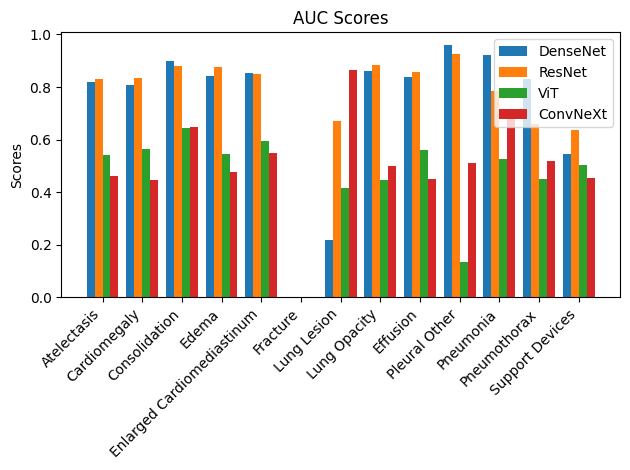

In [ ]:
dm = metrics_summary(densenet_metrics, 'auc_scores')
rm = metrics_summary(resnet_metrics, 'auc_scores')
vit = metrics_summary(vit_metrics, 'auc_scores')
convnext = metrics_summary(convnext_metrics, 'auc_scores')

_plot(
    [dm, rm, vit, convnext],
    ['DenseNet', 'ResNet', 'ViT', 'ConvNeXt'],
    title='AUC Scores',
    y_label='Scores',
)

#### **AUC Scores Discussion:**
The AUC scores visualization indicates that DenseNet and ResNet generally outperform ViT and ConvNeXt across most pathologies, suggesting better predictive reliability. Conditions such as "Atelectasis," "Cardiomegaly," and "Lung Opacity" are more effectively identified by all models, hinting at clearer distinguishing features. In contrast, "Fracture" and "Pleural Other" have lower AUC scores, particularly for ViT and ConvNeXt, which could point to these models' limitations in capturing subtle patterns.

#### **Future Work:**
For future work, enhancing data preprocessing, experimenting with model architectures, and incorporating ensemble techniques could improve detection, especially for less distinct pathologies. Ensuring model decisions are interpretable will be vital for clinical acceptance and application.



### **Accuracy Scores**

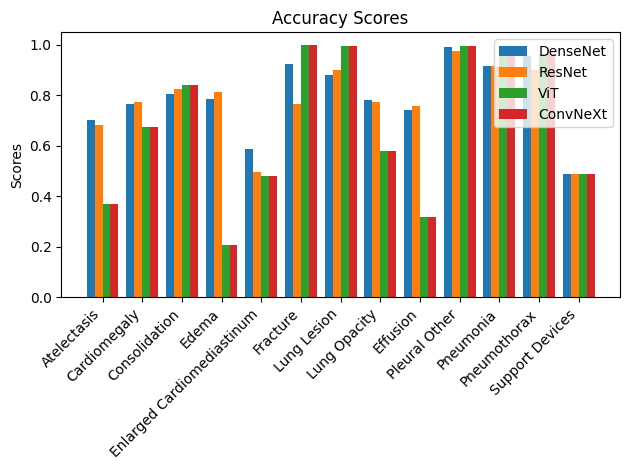

In [ ]:
dm = metrics_summary(densenet_metrics, 'acc_scores')
rm = metrics_summary(resnet_metrics, 'acc_scores')
vit = metrics_summary(vit_metrics, 'acc_scores')
convnext = metrics_summary(convnext_metrics, 'acc_scores')

_plot(
    [dm, rm, vit, convnext],
    ['DenseNet', 'ResNet', 'ViT', 'ConvNeXt'],
    title='Accuracy Scores',
    y_label='Scores',
)

The visualization for accuracy scores shows the performance of the four models—DenseNet, ResNet, ViT, and ConvNeXt—across various pathologies.

#### **Summary of Accuracy Scores:**

- DenseNet and ResNet again appear robust, with DenseNet generally leading, which indicates that these models have a high rate of correct predictions across the different conditions.
- ViT and ConvNeXt exhibit lower accuracy for certain pathologies, which may suggest difficulties with feature extraction or classification for those specific conditions.
- Pathologies like "Atelectasis" and "Edema" show high accuracy across all models, while "Fracture" and "Pleural Other" are lower, indicating possible challenges in those areas for ViT and ConvNeXt.

These accuracy trends align with the previous AUC score analysis, reinforcing the idea that DenseNet and ResNet may be better suited for this dataset. The lower accuracy of ViT and ConvNeXt in certain pathologies may point to the need for model-specific adjustments or more representative training data for those conditions.







### **F1 Scores**

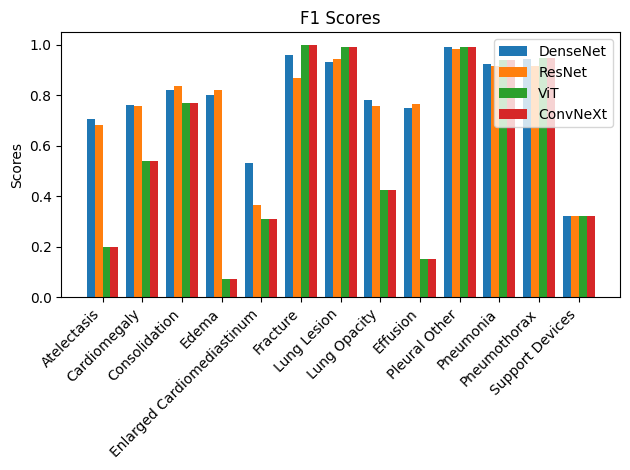

In [ ]:
dm = metrics_summary(densenet_metrics, 'f1_scores')
rm = metrics_summary(resnet_metrics, 'f1_scores')
vit = metrics_summary(vit_metrics, 'f1_scores')
convnext = metrics_summary(convnext_metrics, 'f1_scores')

_plot(
    [dm, rm, vit, convnext],
    ['DenseNet', 'ResNet', 'ViT', 'ConvNeXt'],
    title='F1 Scores',
    y_label='Scores',
)

The bar chart for F1 scores provides insights into the balance between precision and recall for the four machine learning models across different pathologies.

#### **Summary of F1 Scores:**

- DenseNet tends to lead in F1 scores across many pathologies, suggesting it achieves a good balance between precision and recall, which is crucial in medical diagnostics where both false positives and false negatives have significant consequences.
- ResNet is competitive with DenseNet, though slightly lower in some pathologies, indicating it might either be slightly less precise or less sensitive than DenseNet.
- ViT shows a more varied performance, with some pathologies having lower F1 scores, which might signal a disparity between precision and recall that could be improved with model tuning.
- ConvNeXt generally trails behind, especially in certain pathologies, which suggests this model may be struggling with either over-predicting (low precision) or under-predicting (low recall) the conditions.

The F1 score is a crucial metric in medical image analysis since it encapsulates both aspects of model performance that are essential for reliable diagnostics. Models with high F1 scores are typically better suited for deployment in clinical environments due to their balanced predictive performance.







### **Comparison of Models' Metrics**

The heatmap visualizes various performance metrics (AUC, Accuracy, Precision, Recall, F1 Score) for different pathologies assessed by four machine learning models (DenseNet, ResNet, ViT, and ConvNeXt).

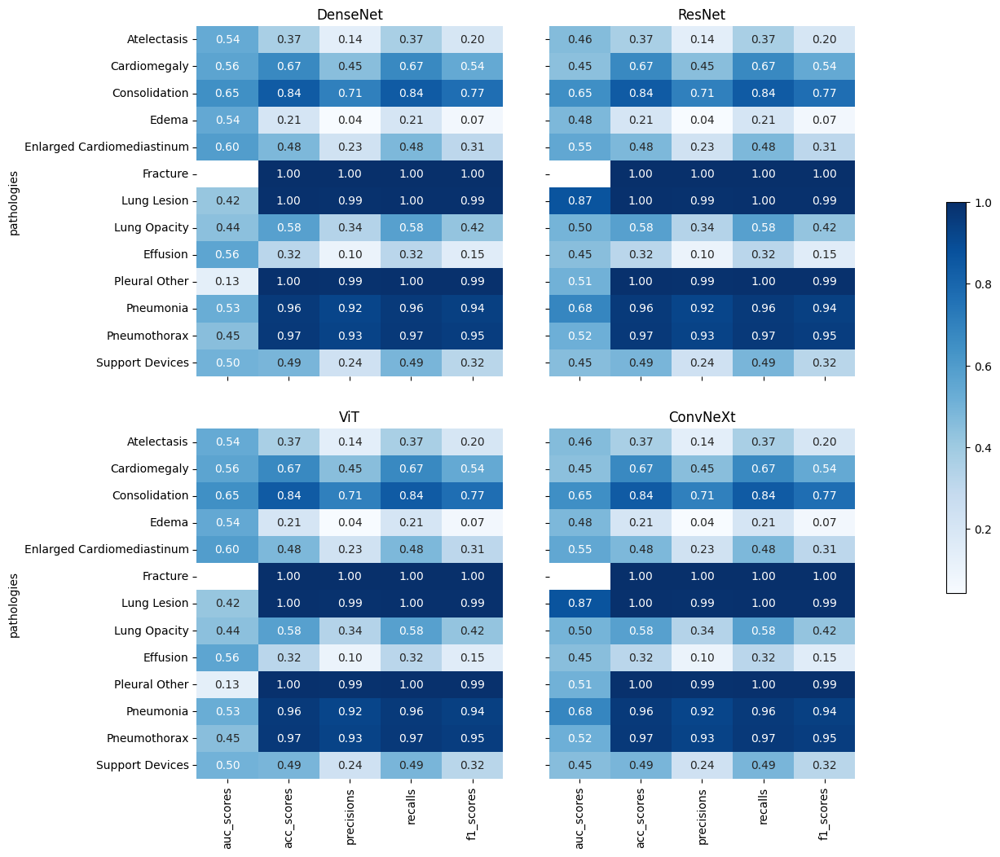

In [ ]:
visualise_heatmaps({
    'DenseNet': vit_metrics,
    'ResNet': convnext_metrics,
    'ViT': vit_metrics,
    'ConvNeXt': convnext_metrics,
})

### **Model Comparison Analysis**

**DenseNet:**

- Exhibits high precision and recall in most pathologies, particularly "Lung Lesion," indicating strong performance in detecting this condition.
- Its F1 scores are generally high, except for "Pleural Other," suggesting a balanced precision-recall trade-off.

**ResNet:**

- Similar to DenseNet, ResNet shows high scores for "Lung Lesion" and "Pneumothorax," implying accurate detection capabilities for these conditions.
- The performance is consistent across metrics, though there are areas where AUC and accuracy are not as high as DenseNet, like in "Cardiomegaly."

**ViT:**

- This model's performance is less uniform, with lower scores across many pathologies and metrics.
- It shows a particularly low precision for "Edema" and "Effusion," which could indicate a higher false positive rate for these conditions.

**ConvNeXt:**

- Has lower scores across the board in comparison to DenseNet and ResNet, especially in precision and F1 score.
- Notably, it has a high recall for "Lung Lesion," which suggests it can detect most positive cases for this condition, although the precision and F1 score are not as high.

### **General Observations**

All models seem to struggle with "Pleural Other," as indicated by lower F1 scores, possibly due to its less distinct features or less representation in the training data.
"Lung Lesion" and "Pneumothorax" are well-detected across models, as shown by the high recall rates, indicating these models are effective in identifying true positives for these pathologies.

### **Main Findings:**

In summarizing the performance comparison, DenseNet and ResNet demonstrate superior and consistent effectiveness across most pathologies, with DenseNet marginally leading in overall performance. These models particularly excel in identifying "Lung Lesion" and "Pneumothorax," suggesting a strong capability to detect these conditions. ViT and ConvNeXt, however, exhibit variability and generally lower performance, with notable challenges in precision for conditions such as "Edema" and "Effusion," indicating potential overprediction issues.

From these findings, DenseNet and ResNet emerge as the more reliable models for clinical diagnostic assistance, given their balanced performance. However, the variability in the F1 scores, especially for "Pleural Other," signals a need for model refinement. Future efforts should focus on enhancing model precision, leveraging advanced tuning, and incorporating comprehensive data strategies to bolster weaker areas. Emphasizing model interpretability will also be critical for clinical integration and trust in automated diagnostics.


### **Insights and Future Work**

- DenseNet and ResNet offer robust performance and could serve as reliable models for clinical application. However, even these models have room for improvement, especially in pathologies with lower F1 scores.
- ViT and ConvNeXt may require additional tuning, more diverse training data, or even architectural changes to improve their performance.
- For future work, it would be beneficial to focus on enhancing model interpretability and exploring data augmentation or rebalancing techniques to improve performance on pathologies where the models currently underperform.






# Explainability

In this section we look into several explanability method and apply them to our trained models, with the aim of helping the clinicians understand and evaluate our complex deep learning based models.



*   Frameworks

>*   Captum
>*   Pytorch-gradcam

*   Methods

>*   Layer-wise Relevance Propagation (LRP)
>*   GradCAM
>*   GradCAM++
>*   ScoreCAM
>*   EigenCAM


While implementing these explanation methods using the mentioned framewroks, we face several issues which will be discuss in the following cells wherever it's applicable.



### importing libraries

In [ ]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, EigenCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import torch

In [ ]:
from captum.attr import LRP, LayerLRP
from captum.attr import visualization as viz
from captum.attr._utils.lrp_rules import EpsilonRule, GammaRule, Alpha1_Beta0_Rule

### Captum

Initially, we chose the Captum framework [5] to implement the explanability methods which are based on gradients calculated during the backpropagation. After doing some experiments on all of the models we have, it turned out that there was a bug when we applied their framework to get the layers’ attribution, as it outputs a full-zero tensor. We dedicated more than two weeks to look into this issue in the framework issue section on github and reviewing the online resources. We also tried to get arround this issue by changing the source code of this framework, yet it didn’t help. Therefore, we opted to use another framework, namely, Pytorch-gradcam to generate the explanations.


Besides the gradient-based explanability methods, as suggested by our mentor, we decided to apply the LRP method as well to compare it with gradient-based methods implemented with pytroch-gradcam and also identify the most important layers to fine-tune the model just by unfreezing these layers and speed up this process.


In the Captum framework, there are two versions of the LRP algorithm: LRP, which only returns the attributions for the input layer, abd LayerLRP, which returns the attributions for all of the layers, allowing us to identify the most contributing layers in the predictions of the model.


After implementing the LRP method with Captum framework and running the code we got inappropriate attributions, similar to the many other algorithms we tested.

Here in this [link](https://github.com/pytorch/captum/blob/master/tutorials/TorchVision_Interpret.ipynb), the authors of this framework mention that this method only supports vgg16 model currently and they yet have to extend it to be applied to more complex models such as Resnet, and DenseNet.

This [link](https://github.com/pytorch/captum/issues/712) is an issue thread in the repository which is related to the challenges we faced. The authors couldn't eventually fix the problem and ask each other to fix some parts of the code according to this issue.


AS you will see in the following celles, we also tried the LayerLRP version and it explicitly says that using the Module ReLU(inplace=True)  more than once in the network, is not supported by LRP, which applys to all of the four models we have in this project.

In [ ]:
from torchvision import transforms
from PIL import Image
import numpy as np


resnet_transform = transforms.Compose([
    xrv.datasets.XRayCenterCrop(),
    xrv.datasets.XRayResizer(512, engine="cv2"),
    transforms.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1))
])

chexpert = load_chexpert(transform=resnet_transform, mode='test')

idx = 43
sample = chexpert[idx]
input = sample["img"]
label = sample["lab"]

In [ ]:
label


array([1., 0., 1., 1., 0., 0., 0., 1., 1., 0., 0., 0., 1.])

In [ ]:
transform = transforms.Compose([
 transforms.Resize(512),
 transforms.CenterCrop(512),
 transforms.ToTensor()
])

img = Image.open(chexpert.csv.iloc[idx]["Path"])

transformed_img = transform(img)

In [ ]:
resnet_model = pre_trained_resnet(pathologies=chexpert.pathologies)
resnet_model.eval()

If this fails you can run `wget https://github.com/mlmed/torchxrayvision/releases/download/v1/pc-nih-rsna-siim-vin-resnet50-test512-e400-state.pt -O /root/.torchxrayvision/models_data/pc-nih-rsna-siim-vin-resnet50-test512-e400-state.pt`
[██████████████████████████████████████████████████]


XRV-ResNet-resnet50-res512-all

In [ ]:
def get_all_layers(model):
    layers = []

    def add_layers(module):
        for layer in module.children():
            if list(layer.children()):
                add_layers(layer)
            else:
                layers.append(layer)

    add_layers(model)

    return layers

layers = list(get_all_layers(resnet_model.model))
layers
num_layers = len(layers)

# for idx_layer in range(1, num_layers):
#     if idx_layer <= 16:
#         setattr(layers[idx_layer], "rule", GammaRule())
#     elif 17 <= idx_layer <= 30:
#         setattr(layers[idx_layer], "rule", EpsilonRule())
#     elif idx_layer >= 31:
#         setattr(layers[idx_layer], "rule", EpsilonRule(epsilon=0))
setattr(resnet_model.upsample, "rule", GammaRule())

lrp = LRP(resnet_model)
attributions_lrp = lrp.attribute(input.unsqueeze(0), target=0)

In [ ]:
print(attributions_lrp.squeeze().cpu().detach().numpy().min())
print(attributions_lrp.squeeze().cpu().detach().numpy().mean())
print(attributions_lrp.squeeze().cpu().detach().numpy().max())

-1.5359296e+18
-17212758000000.0
1.4191858e+18


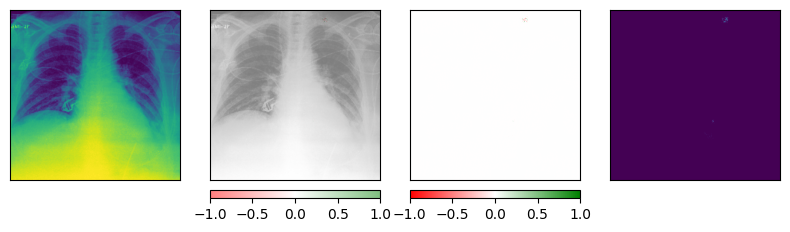

In [ ]:
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_lrp.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "blended_heat_map","heat_map", "masked_image"],
                                      ["all", "all", "all", "positive"],
                                      show_colorbar=True,
                                      )

In [ ]:
def get_all_layers(model):
    layers = []

    def add_layers(module):
        for layer in module.children():
            if list(layer.children()):
                add_layers(layer)
            else:
                layers.append(layer)

    add_layers(model)

    return layers

layers = list(get_all_layers(resnet_model.model))
layers
num_layers = len(layers)

for idx_layer in range(1, num_layers):
    if idx_layer <= 16:
        setattr(layers[idx_layer], "rule", GammaRule())
    elif 17 <= idx_layer <= 30:
        setattr(layers[idx_layer], "rule", EpsilonRule())
    elif idx_layer >= 31:
        setattr(layers[idx_layer], "rule", EpsilonRule(epsilon=0))
setattr(resnet_model.upsample, "rule", GammaRule())

layer_lrp = LayerLRP(resnet_model, layer=layers)
attributions_lrp = layer_lrp.attribute(input.unsqueeze(0), target=0)

RuntimeError: ignored

In [ ]:
def get_all_layers(model):
    layers = []

    def add_layers(module):
        for layer in module.children():
            if list(layer.children()):
                add_layers(layer)
            else:
                layers.append(layer)

    add_layers(model)

    return layers

layers = list(get_all_layers(resnet_model.model))
num_layers = len(layers)

for idx_layer in range(1, num_layers):
    if idx_layer <= 16:
        setattr(layers[idx_layer], "rule", GammaRule())
    elif 17 <= idx_layer <= 30:
        setattr(layers[idx_layer], "rule", EpsilonRule())
    elif idx_layer >= 31:
        setattr(layers[idx_layer], "rule", EpsilonRule(epsilon=0))
setattr(resnet_model.upsample, "rule", GammaRule())

layer_lrp = LayerLRP(resnet_model, layer=resnet_model.model.layer4[-1])
attributions_lrp = layer_lrp.attribute(input.unsqueeze(0), target=0)

RuntimeError: ignored

From this section onwards we shift to use the Pytorch-gradcam framework and we generate the explanations for all of the models in their designated section.

### DenseNet

#### Preparing the input data and model

In [ ]:
from torchvision import transforms
from PIL import Image
import numpy as np


densenet_transform = transforms.Compose([
  xrv.datasets.XRayCenterCrop(),
  xrv.datasets.XRayResizer(224, engine="cv2"),
  transforms.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1))
])

chexpert = load_chexpert(transform=densenet_transform, mode='test')

idx = 85
sample = chexpert[idx]
input = sample["img"]
label = sample["lab"]

Setting XRayResizer engine to cv2 could increase performance.


In [ ]:
transform = transforms.Compose([
 transforms.Resize(256),
 transforms.CenterCrop(224),
 transforms.ToTensor()
])

img = Image.open(chexpert.csv.iloc[idx]["Path"])

transformed_img = transform(img)

Note: the target models is selected based on what the authors suggested in the [documentation](https://github.com/jacobgil/pytorch-grad-cam) for each model.

In [ ]:
densenet_model = pre_trained_densenet(pathologies=chexpert.pathologies)
densenet_model, densenet_train_stats = load_model(densenet_model)

target_layers = [densenet_model.features[-1]]

# The requires_grad should be set to True for all model's parameters
for param in densenet_model.parameters():
        param.requires_grad_(True)

#### GradCAM [1]

**How does the method work?**

GradCAM works by leveraging the gradients of the model's final convolutional layer with respect to a specific class of interest in the target image. By taking these gradients, it identifies the regions in the image that most strongly influence the model's decision for that particular class.

GradCAM then combines these gradients with the feature maps from the same convolutional layer, effectively highlighting the areas in the image that the model "looks at" when making predictions. This technique generates heatmaps that vividly show which parts of the image are most important in making a particular classification.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=densenet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

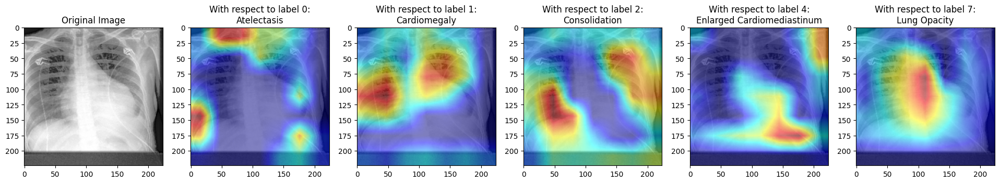

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### GradCAMPlusPlus [2]

**How does the method work?**

GradCAM++ builds upon GradCAM's principles by providing more accurate and localized heatmaps. It achieves this by incorporating the second-order derivatives of the model's output with respect to the feature maps in the last convolutional layer.

According to the extensive experiments performed on various datasets available in the  paper, this refinement allows GradCAM++ to focus more precisely on the critical regions of the image that influence the model's decision-making, resulting in more accurate and localized visual explanations. By combining the first-order and second-order gradients, GradCAM++ enhances the interpretability and trustworthiness of deep learning models.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAMPlusPlus(model=densenet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

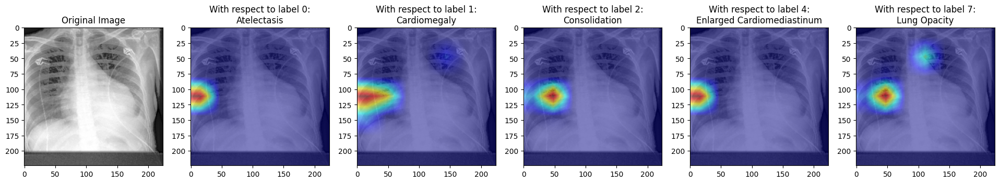

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAMPP = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAMPP)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAMPP[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### ScoreCAM [3]

**How does the method work?**



ScoreCAM accomplishes this by taking advantage of the class scores or logits produced by the model before the softmax layer. It attributes relevance to the feature maps of the final convolutional layer based on the influence of these scores by perbutating the image by the scaled activations and measure how the output drops.

This process helps ScoreCAM identify the most discriminative regions in the input image that are crucial for a particular class's prediction. By using the class scores, ScoreCAM can generate heatmaps that emphasize the regions responsible for a model's classification decision.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=densenet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

100%|██████████| 64/64 [00:03<00:00, 19.76it/s]


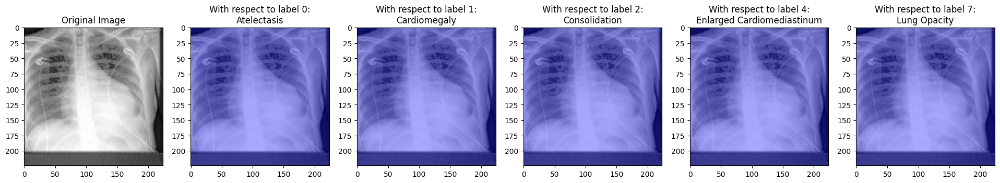

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_ScoreCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_ScoreCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_ScoreCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### EigenCAM [4]

**How does the method work?**

Eigen-CAM builds on the principles of GradCAM and ScoreCAM by using the eigenvalues of the feature maps from the final convolutional layer. One of its distinctive features is its use of the first principal component of the 2D activations, a technique that further refines the focus on relevant image regions. These eigenvalues capture the importance and diversity of features within the layer.

Eigen-CAM employs this information to weigh the feature maps differently, emphasizing the most salient regions associated with a specific class.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = EigenCAM(model=densenet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

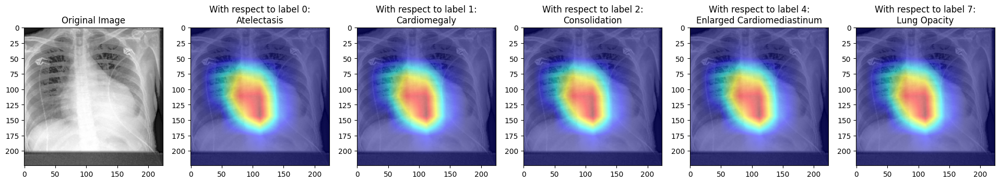

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_EigenCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_EigenCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_EigenCAM[i], cmap='gray')
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### Methods Comparison

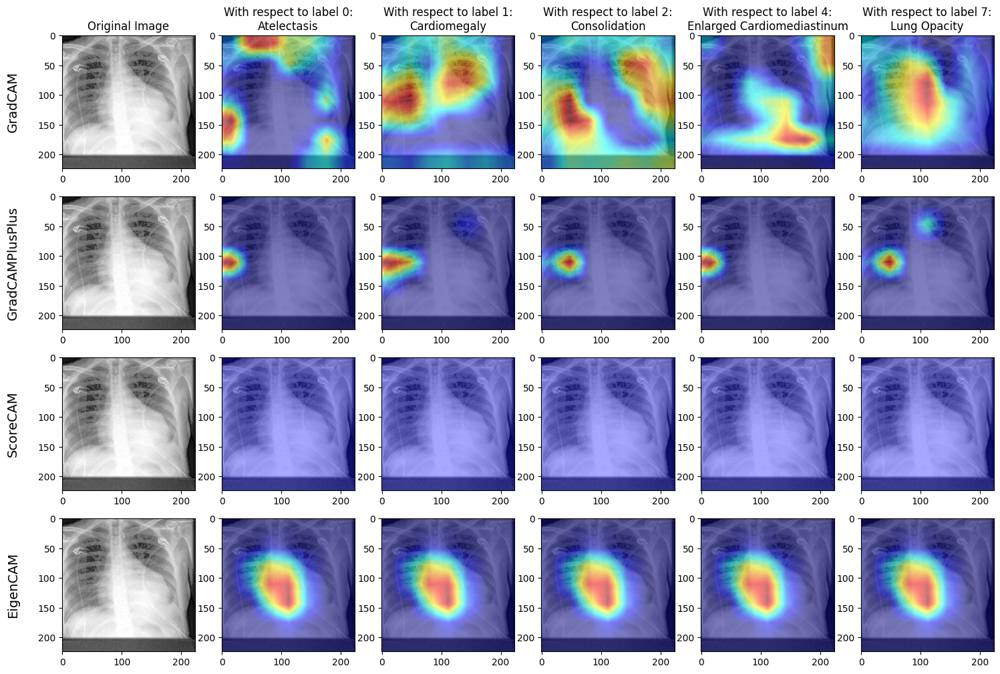

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(4, num_images, figsize=(3*num_images, 2*num_images))

for i in range(num_images):
    axes[0][i].imshow(image_list_GradCAM[i], cmap='gray')
    if i==0:
      axes[0][i].set_title("Original Image")
    else:
      axes[0][i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')


for i in range(num_images):
    axes[1][i].imshow(image_list_GradCAMPP[i], cmap='gray')


for i in range(num_images):
    axes[2][i].imshow(image_list_ScoreCAM[i], cmap='gray')

for i in range(num_images):
    axes[3][i].imshow(image_list_EigenCAM[i], cmap='gray')


# Add vertical row titles
row_titles = ["GradCAM", "GradCAMPlusPlus", "ScoreCAM", "EigenCAM"]
for i, row_title in enumerate(row_titles):
    axes[i][0].set_ylabel(row_title, rotation="vertical", fontsize=14, labelpad=20)

plt.show()






#### ****Insights****

We can observe that the GradCAM method  produces the most reliable results.

Although we don’t have the adequate medical background to interpret these outcomes, the heatmaps agree with the definitions of these diseases:

**Lung Opacity:**

An abnormality seen on chest imaging, where an area of the lung appears denser than the surrounding normal lung tissue.

We can observe the model focused on the light area of the chest where it's denser than the rest of the image for this pathalogy in the 7th column of the figure for the GradCAM method.


**Enlarged Cardiomediastinum:**

A condition in which there is an increased size or prominence of the structures within the mediastinum, specifically involving the heart and great vessels.

We can observe the model focused on the area where the heart of the patient is located for this pathalogy in the 6th column of the figure for the GradCAM method.



###ResNet

#### Preparing the input data and model

In [ ]:
from torchvision import transforms
from PIL import Image
import numpy as np


resnet_transform = transforms.Compose([
    xrv.datasets.XRayCenterCrop(),
    xrv.datasets.XRayResizer(512, engine="cv2"),
    transforms.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1))
])

chexpert = load_chexpert(transform=resnet_transform, mode='test')

idx = 85
sample = chexpert[idx]
input = sample["img"]
label = sample["lab"]

Setting XRayResizer engine to cv2 could increase performance.


In [ ]:
transform = transforms.Compose([
 transforms.Resize(512),
 transforms.CenterCrop(512),
 transforms.ToTensor()
])

img = Image.open(chexpert.csv.iloc[idx]["Path"])

transformed_img = transform(img)

Note: the target models is selected based on what the authors suggested in the [documentation](https://github.com/jacobgil/pytorch-grad-cam) for each model.

In [ ]:
resnet_model = pre_trained_resnet(pathologies=chexpert.pathologies)
resnet_model, resnet_train_stats = load_model(resnet_model)

target_layers = [resnet_model.model.layer4[-1]]

# The requires_grad should be set to True for all model's parameters
for param in resnet_model.parameters():
        param.requires_grad_(True)

#### GradCAM [1]

**How does the method work?**

GradCAM works by leveraging the gradients of the model's final convolutional layer with respect to a specific class of interest in the target image. By taking these gradients, it identifies the regions in the image that most strongly influence the model's decision for that particular class.

GradCAM then combines these gradients with the feature maps from the same convolutional layer, effectively highlighting the areas in the image that the model "looks at" when making predictions. This technique generates heatmaps that vividly show which parts of the image are most important in making a particular classification.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=resnet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

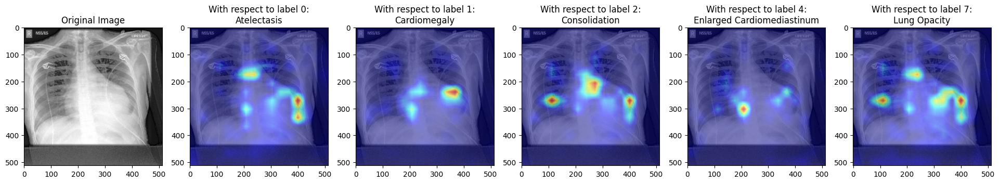

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### GradCAMPlusPlus [2]

**How does the method work?**

GradCAM++ builds upon GradCAM's principles by providing more accurate and localized heatmaps. It achieves this by incorporating the second-order derivatives of the model's output with respect to the feature maps in the last convolutional layer.

According to the extensive experiments performed on various datasets available in the  paper, this refinement allows GradCAM++ to focus more precisely on the critical regions of the image that influence the model's decision-making, resulting in more accurate and localized visual explanations. By combining the first-order and second-order gradients, GradCAM++ enhances the interpretability and trustworthiness of deep learning models.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAMPlusPlus(model=resnet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

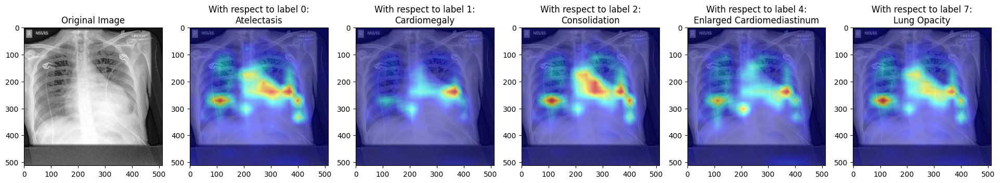

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAMPP = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAMPP)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAMPP[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### ScoreCAM [3]

**How does the method work?**



ScoreCAM accomplishes this by taking advantage of the class scores or logits produced by the model before the softmax layer. It attributes relevance to the feature maps of the final convolutional layer based on the influence of these scores by perbutating the image by the scaled activations and measure how the output drops.

This process helps ScoreCAM identify the most discriminative regions in the input image that are crucial for a particular class's prediction. By using the class scores, ScoreCAM can generate heatmaps that emphasize the regions responsible for a model's classification decision.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=resnet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

100%|██████████| 128/128 [00:29<00:00,  4.30it/s]


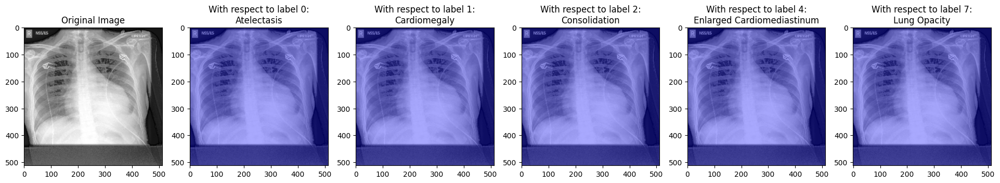

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_ScoreCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_ScoreCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_ScoreCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### EigenCAM [4]

**How does the method work?**

Eigen-CAM builds on the principles of GradCAM and ScoreCAM by using the eigenvalues of the feature maps from the final convolutional layer. One of its distinctive features is its use of the first principal component of the 2D activations, a technique that further refines the focus on relevant image regions. These eigenvalues capture the importance and diversity of features within the layer.

Eigen-CAM employs this information to weigh the feature maps differently, emphasizing the most salient regions associated with a specific class.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = EigenCAM(model=resnet_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

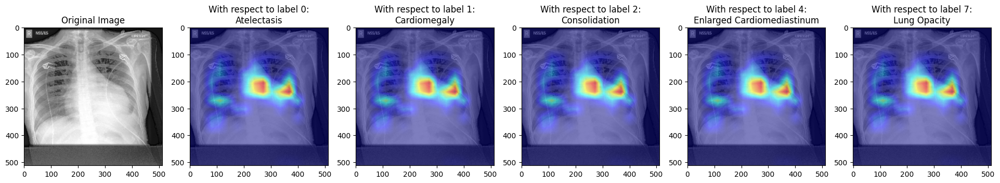

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_EigenCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_EigenCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_EigenCAM[i], cmap='gray')
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### Methods Comparison

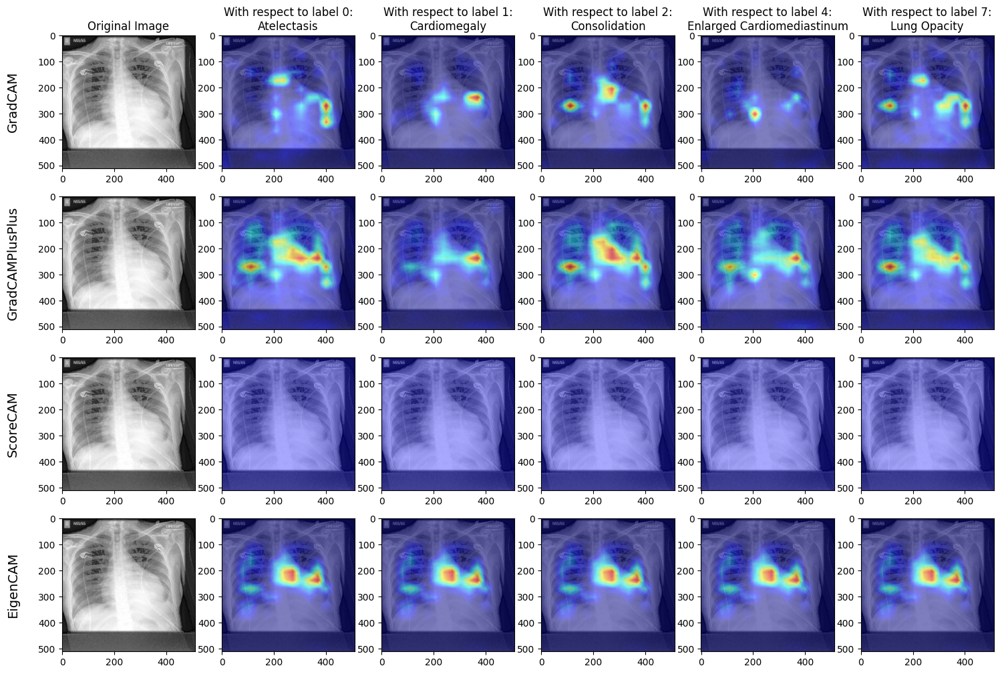

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(4, num_images, figsize=(3*num_images, 2*num_images))

for i in range(num_images):
    axes[0][i].imshow(image_list_GradCAM[i], cmap='gray')
    if i==0:
      axes[0][i].set_title("Original Image")
    else:
      axes[0][i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')


for i in range(num_images):
    axes[1][i].imshow(image_list_GradCAMPP[i], cmap='gray')


for i in range(num_images):
    axes[2][i].imshow(image_list_ScoreCAM[i], cmap='gray')

for i in range(num_images):
    axes[3][i].imshow(image_list_EigenCAM[i], cmap='gray')


# Add vertical row titles
row_titles = ["GradCAM", "GradCAMPlusPlus", "ScoreCAM", "EigenCAM"]
for i, row_title in enumerate(row_titles):
    axes[i][0].set_ylabel(row_title, rotation="vertical", fontsize=14, labelpad=20)

plt.show()


#### ****Insights****

Here we can notice that the unlike the Densenet model, here GradCAM++ method's outputs are more aligned with the definitions of the diseases, specially for the Lung Opacity, and the Enlarged Cardiomediastinum disease. We can observe that models focused on the dense light area and the heart of the patient respectively.

### ViT

#### Preparing the input data and model

In [ ]:
from torchvision import transforms
from PIL import Image
import numpy as np


transform_vit = transforms.Compose([
    xrv.datasets.XRayCenterCrop(),
    xrv.datasets.XRayResizer(224, engine="cv2"),
    transforms.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1))
])

chexpert = load_chexpert(transform=transform_vit, mode='test')

idx = 85
sample = chexpert[idx]
input = sample["img"]
label = sample["lab"]

Setting XRayResizer engine to cv2 could increase performance.


In [ ]:
transform = transforms.Compose([
 transforms.Resize(256),
 transforms.CenterCrop(224),
 transforms.ToTensor()
])

img = Image.open(chexpert.csv.iloc[idx]["Path"])

transformed_img = transform(img)

Note: the target models is selected based on what the authors suggested in the [documentation](https://github.com/jacobgil/pytorch-grad-cam) for each model.

In [ ]:
def reshape_transform(tensor, height=14, width=14):
    result = tensor[:, 1 :  , :].reshape(tensor.size(0),
        height, width, tensor.size(2))

    # Bring the channels to the first dimension,
    # like in CNNs.
    result = result.transpose(2, 3).transpose(1, 2)
    return result

vit_model = pre_trained_vit(chexpert.pathologies)
vit_model, vit_train_stats = load_model(vit_model)

# target_layers = [vit_model.encoder.layer[-1].layernorm_before]
target_layers = [vit_model.blocks[-1].norm1]

# The requires_grad should be set to True for all model's parameters
for param in vit_model.parameters():
        param.requires_grad_(True)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

#### GradCAM [1]

**How does the method work?**

GradCAM works by leveraging the gradients of the model's final convolutional layer with respect to a specific class of interest in the target image. By taking these gradients, it identifies the regions in the image that most strongly influence the model's decision for that particular class.

GradCAM then combines these gradients with the feature maps from the same convolutional layer, effectively highlighting the areas in the image that the model "looks at" when making predictions. This technique generates heatmaps that vividly show which parts of the image are most important in making a particular classification.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=vit_model, target_layers=target_layers, use_cuda=True, reshape_transform=reshape_transform)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

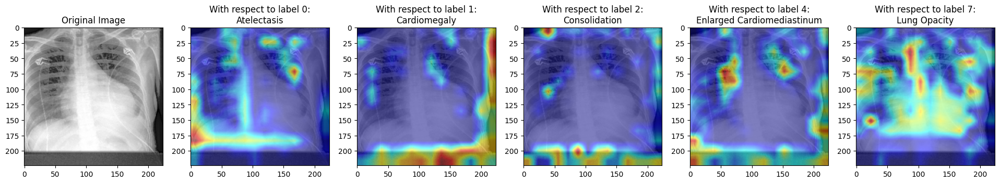

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### GradCAMPlusPlus [2]

**How does the method work?**

GradCAM++ builds upon GradCAM's principles by providing more accurate and localized heatmaps. It achieves this by incorporating the second-order derivatives of the model's output with respect to the feature maps in the last convolutional layer.

According to the extensive experiments performed on various datasets available in the  paper, this refinement allows GradCAM++ to focus more precisely on the critical regions of the image that influence the model's decision-making, resulting in more accurate and localized visual explanations. By combining the first-order and second-order gradients, GradCAM++ enhances the interpretability and trustworthiness of deep learning models.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAMPlusPlus(model=vit_model, target_layers=target_layers, use_cuda=True, reshape_transform=reshape_transform)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

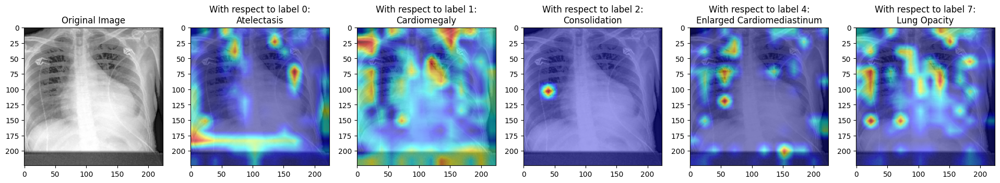

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAMPP = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAMPP)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAMPP[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### ScoreCAM [3]

**How does the method work?**



ScoreCAM accomplishes this by taking advantage of the class scores or logits produced by the model before the softmax layer. It attributes relevance to the feature maps of the final convolutional layer based on the influence of these scores by perbutating the image by the scaled activations and measure how the output drops.

This process helps ScoreCAM identify the most discriminative regions in the input image that are crucial for a particular class's prediction. By using the class scores, ScoreCAM can generate heatmaps that emphasize the regions responsible for a model's classification decision.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=vit_model, target_layers=target_layers, use_cuda=True, reshape_transform=reshape_transform)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

100%|██████████| 48/48 [00:08<00:00,  5.36it/s]


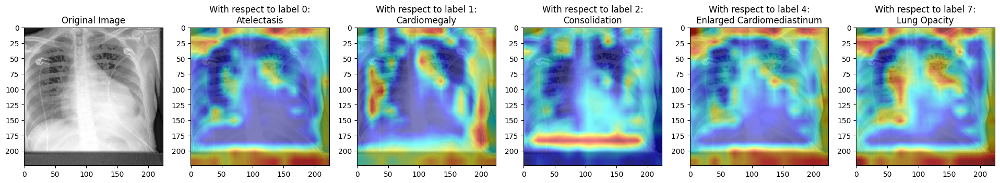

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_ScoreCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_ScoreCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_ScoreCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### EigenCAM [4]

**How does the method work?**

Eigen-CAM builds on the principles of GradCAM and ScoreCAM by using the eigenvalues of the feature maps from the final convolutional layer. One of its distinctive features is its use of the first principal component of the 2D activations, a technique that further refines the focus on relevant image regions. These eigenvalues capture the importance and diversity of features within the layer.

Eigen-CAM employs this information to weigh the feature maps differently, emphasizing the most salient regions associated with a specific class.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = EigenCAM(model=vit_model, target_layers=target_layers, use_cuda=True, reshape_transform=reshape_transform)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

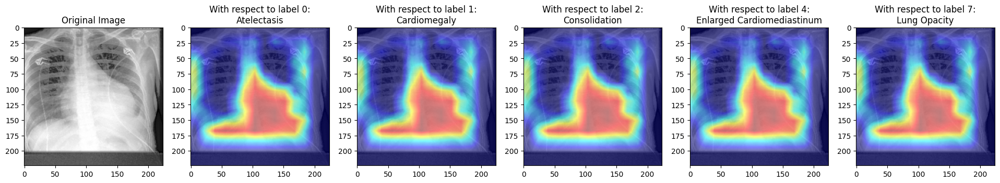

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_EigenCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_EigenCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_EigenCAM[i], cmap='gray')
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### Methods Comparison

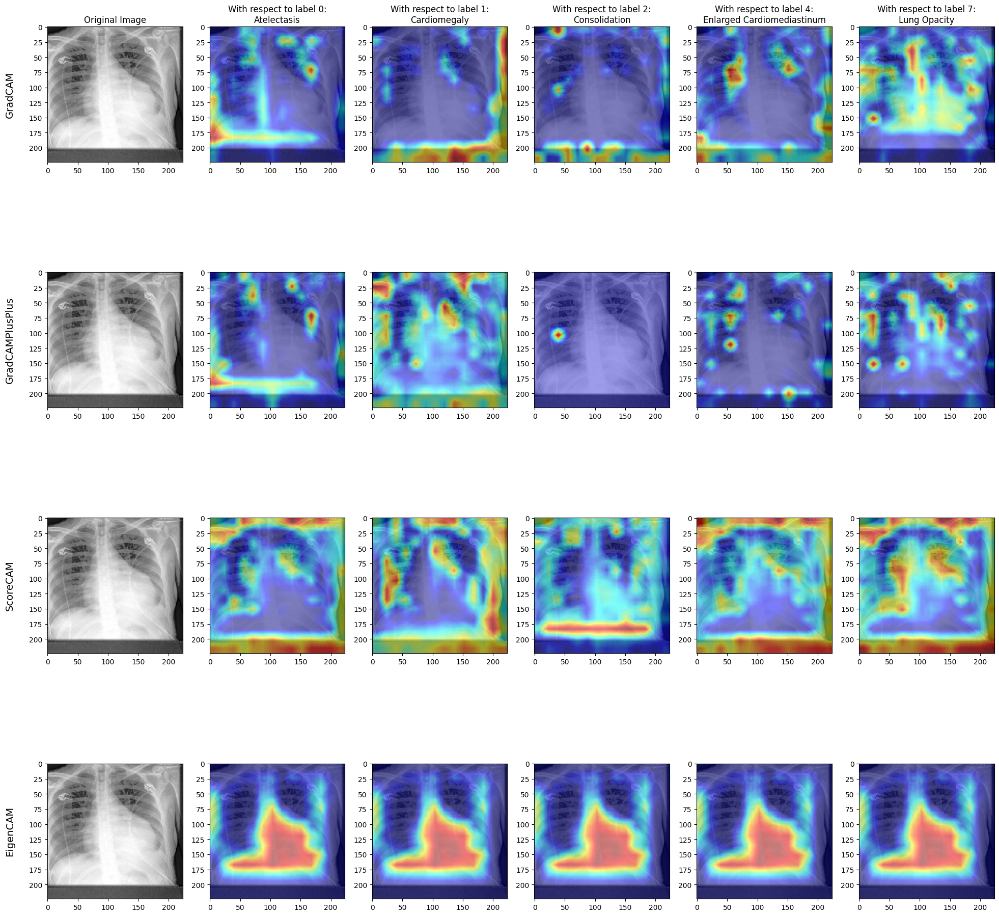

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(4, num_images, figsize=(4*num_images, 4*num_images))

for i in range(num_images):
    axes[0][i].imshow(image_list_GradCAM[i], cmap='gray')
    if i==0:
      axes[0][i].set_title("Original Image")
    else:
      axes[0][i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')


for i in range(num_images):
    axes[1][i].imshow(image_list_GradCAMPP[i], cmap='gray')


for i in range(num_images):
    axes[2][i].imshow(image_list_ScoreCAM[i], cmap='gray')

for i in range(num_images):
    axes[3][i].imshow(image_list_EigenCAM[i], cmap='gray')


# Add vertical row titles
row_titles = ["GradCAM", "GradCAMPlusPlus", "ScoreCAM", "EigenCAM"]
for i, row_title in enumerate(row_titles):
    axes[i][0].set_ylabel(row_title, rotation="vertical", fontsize=14, labelpad=20)

plt.show()


#### ****Insights****

Here we can notice that most of the explanations aren't reliable since the model isn't trained on a sufficient amount of data.
However, the GradCAM method's outputs are more aligned with the definitions of the Lung Opacity disease, because we can observe that the model focused on the dense light area in the middle of the chest.

### ConvNext

#### Preparing the input data and model

In [ ]:
from torchvision import transforms
from PIL import Image
import numpy as np


convnext_transform = transforms.Compose([
  xrv.datasets.XRayCenterCrop(),
  xrv.datasets.XRayResizer(288, engine="cv2"),
  transforms.Lambda(lambda x: torch.from_numpy(x).expand(3, -1, -1)),
])

chexpert = load_chexpert(transform=convnext_transform, mode='test')

idx = 85
sample = chexpert[idx]
input = sample["img"]
label = sample["lab"]

Setting XRayResizer engine to cv2 could increase performance.


In [ ]:
transform = transforms.Compose([
 transforms.Resize(288),
 transforms.CenterCrop(288),
 transforms.ToTensor()
])

img = Image.open(chexpert.csv.iloc[idx]["Path"])

transformed_img = transform(img)

**Note**

Unlikne the rest of the models, as the frameworks documentation doesn't specify which layer shuold the targeted in the explanation methods, we adopted the same approach to the rest of the models and selected the last block of the model which contains the convolutional layers. This is the conventional practivce suggested by the GradCAM paper.

In [ ]:
convnext_model = pre_trained_convnext(pathologies=chexpert.pathologies)
convnext_model, convnext_train_stats = load_model(convnext_model)

target_layers = [convnext_model.stages[-1].blocks[-1]]

# The requires_grad should be set to True for all model's parameters
for param in convnext_model.parameters():
        param.requires_grad_(True)

model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

#### GradCAM [1]

**How does the method work?**

GradCAM works by leveraging the gradients of the model's final convolutional layer with respect to a specific class of interest in the target image. By taking these gradients, it identifies the regions in the image that most strongly influence the model's decision for that particular class.

GradCAM then combines these gradients with the feature maps from the same convolutional layer, effectively highlighting the areas in the image that the model "looks at" when making predictions. This technique generates heatmaps that vividly show which parts of the image are most important in making a particular classification.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=convnext_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

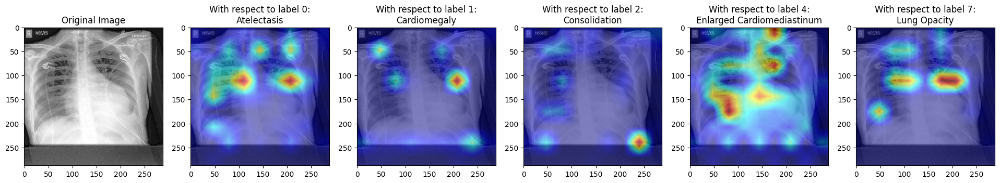

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### GradCAMPlusPlus [2]

**How does the method work?**

GradCAM++ builds upon GradCAM's principles by providing more accurate and localized heatmaps. It achieves this by incorporating the second-order derivatives of the model's output with respect to the feature maps in the last convolutional layer.

According to the extensive experiments performed on various datasets available in the  paper, this refinement allows GradCAM++ to focus more precisely on the critical regions of the image that influence the model's decision-making, resulting in more accurate and localized visual explanations. By combining the first-order and second-order gradients, GradCAM++ enhances the interpretability and trustworthiness of deep learning models.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = GradCAMPlusPlus(model=convnext_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

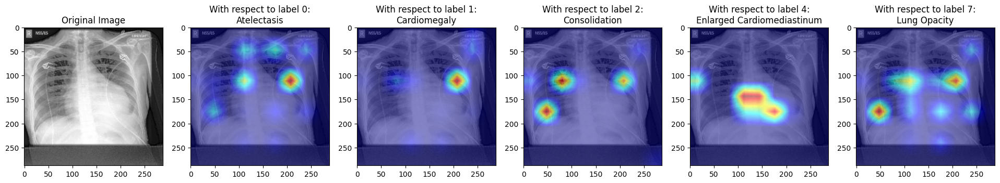

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_GradCAMPP = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_GradCAMPP)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_GradCAMPP[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### ScoreCAM [3]

**How does the method work?**



ScoreCAM accomplishes this by taking advantage of the class scores or logits produced by the model before the softmax layer. It attributes relevance to the feature maps of the final convolutional layer based on the influence of these scores by perbutating the image by the scaled activations and measure how the output drops.

This process helps ScoreCAM identify the most discriminative regions in the input image that are crucial for a particular class's prediction. By using the class scores, ScoreCAM can generate heatmaps that emphasize the regions responsible for a model's classification decision.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = ScoreCAM(model=convnext_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

100%|██████████| 48/48 [00:05<00:00,  9.19it/s]


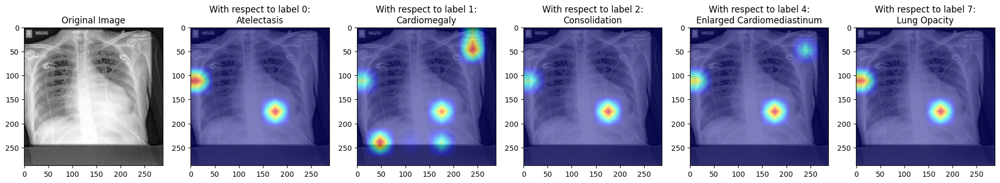

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_ScoreCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_ScoreCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_ScoreCAM[i], cmap='gray')  # Assuming grayscale images
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### EigenCAM [4]

**How does the method work?**

Eigen-CAM builds on the principles of GradCAM and ScoreCAM by using the eigenvalues of the feature maps from the final convolutional layer. One of its distinctive features is its use of the first principal component of the 2D activations, a technique that further refines the focus on relevant image regions. These eigenvalues capture the importance and diversity of features within the layer.

Eigen-CAM employs this information to weigh the feature maps differently, emphasizing the most salient regions associated with a specific class.

In [ ]:
# Construct the CAM object once, and then re-use it on many images:
cam = EigenCAM(model=convnext_model, target_layers=target_layers, use_cuda=True)

In [ ]:
input_tensor = input.unsqueeze(0)


cams_on_image = []
all_labels_idx = np.argwhere(label == 1).reshape(-1)
for target in all_labels_idx:
  targets = [ClassifierOutputTarget(target)]

  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets= targets)

  cams_on_image.append(show_cam_on_image(np.transpose(transformed_img.numpy(), (1,2,0)), grayscale_cam[0, :], use_rgb=True))

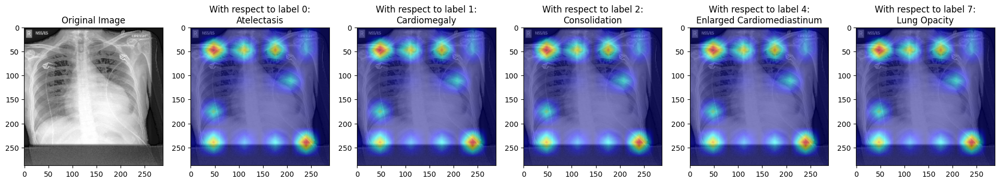

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

image_list_EigenCAM = [np.transpose(transformed_img.numpy(), (1,2,0))] + cams_on_image

# Create subplots to display each image
num_images = len(image_list_EigenCAM)
fig, axes = plt.subplots(1, num_images, figsize=(4*num_images, num_images))

for i in range(num_images):
    axes[i].imshow(image_list_EigenCAM[i], cmap='gray')
    if i==0:
      axes[i].set_title("Original Image")
    else:
      axes[i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')

plt.show()


#### Methods Comparison

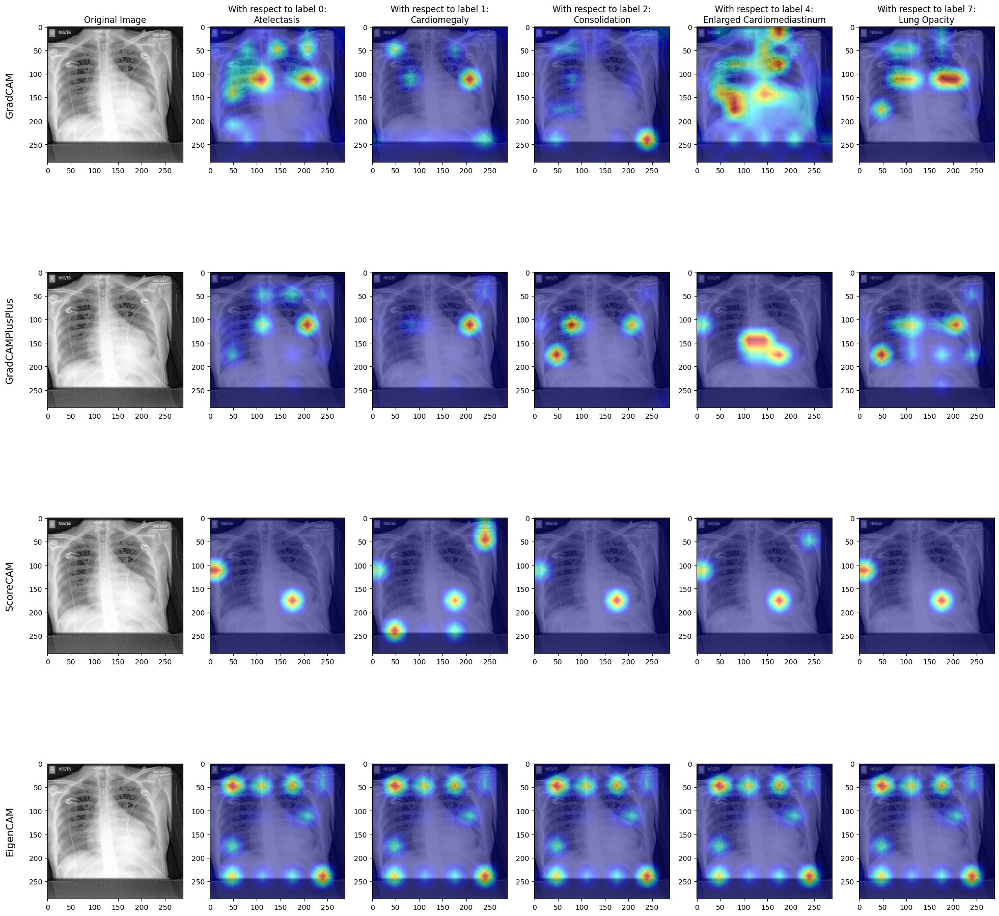

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create subplots to display each image
num_images = len(image_list_GradCAM)
fig, axes = plt.subplots(4, num_images, figsize=(4*num_images, 4*num_images))

for i in range(num_images):
    axes[0][i].imshow(image_list_GradCAM[i], cmap='gray')
    if i==0:
      axes[0][i].set_title("Original Image")
    else:
      axes[0][i].set_title(f'With respect to label {all_labels_idx[i-1]}:\n{chexpert.pathologies[all_labels_idx[i-1]]}')


for i in range(num_images):
    axes[1][i].imshow(image_list_GradCAMPP[i], cmap='gray')


for i in range(num_images):
    axes[2][i].imshow(image_list_ScoreCAM[i], cmap='gray')

for i in range(num_images):
    axes[3][i].imshow(image_list_EigenCAM[i], cmap='gray')


# Add vertical row titles
row_titles = ["GradCAM", "GradCAMPlusPlus", "ScoreCAM", "EigenCAM"]
for i, row_title in enumerate(row_titles):
    axes[i][0].set_ylabel(row_title, rotation="vertical", fontsize=14, labelpad=20)

plt.show()


#### ****Insights****

Here we can notice that most of the explanations aren't reliable since the model isn't trained on a sufficient amount of data.

### Conclusion


Based on our limited experiments conducted here, we came to a conclusion that the GradCAM method seems to generate the most reliable explanations. Having said that, we believe it's required to have clinicians verify and validate the generated explanations and help us debug our models.

#Discussion

# Limitations
In this project, we faced a few challenges that put limits on what we could achieve. One major challenge was the lack of enough computing power. This meant we couldn't train our models using the entire dataset similar to the main paper we inspired the whole project from [6]. So, our models might not have learned as much as they could have if we had more computing power.

Another problem was how our dataset was labeled and how the pre-trained models were set up. There were some differences, in the pre-trained models output logic and what we have in the CheXpert dataset.

The limited 4-week period for this project limited the number of experiments we could do and how deeply we could dive into the details, yet we successfully managed to train and evaluate 4 different deaap learning-based models on the smaller portion of the gigantic dataset we had.

So, because of these limitations in computing power, labeling differences, dataset size, and time constraints, we couldn't explore and improve our models as much as we wanted to. It's a bit like trying to run a race with some weights tied to your legs - it slows you down.

#Future work

Given additional time and extended computational power, longer training sessions for the models would be possible. This would involve unfreezing more layers in the ViT and ConvNeXt, leading to performance improvements and comparability with the DenseNet and ResNet models. Working with a certified radiologist to verify and evaluate the outcomes of the explainability techniques would also be important. We believe their insights on the explanation outputs would be extremely useful to debug the model and improve its performance.

Subsequently, a concept for integrating the use of neural networks for the classification of chest x-rays into the workflow of medical personnel could be developed.

# References

##Introduction and Dataset


  [1] Sarvamangala, D. R., Kulkarni, R. V., 2020. Convultional neural networks in medical image understanding: a survey

  [2] Burkart, N., Hubert, M.F., 2021. A survey on the explainability of supervised machine learning, J. Artificial Intelligence Res. 70. 245-317 (https://www.jair.org/index.php/jair/article/view/12228/26647)

  [3] Salahuddin, Z., Woodruff, H.C., Chatterjee, A., Lambin, P., 2022. Transparency of deep neural networks for medical image analysis: A review of interpretability methods, Computer in Biology and Medicine 140 – 105111

  [4] Finale Doshi-Velez and Been Kim. 2017. Towards a rigorous science of interpretable machine learning. stat 1050 (2017)

  [5] Messina, P. 2022, A survey on Deep Learning and Explainability for Automatoc Report Generation from Medical Images, ACM Computing Surveys, Vol. 54, No. 10s, Article 20

  [6] TorchXRayVision (https://github.com/mlmed/torchxrayvision#torchxrayvision)

  [7] Irvi, J 2019, CheXpert: A Large Chest Radiograph Dataset with Uncertainty Labels and Expert Comparison




##Models

[1] Huang, Gao, et al. "Densely connected convolutional networks." Proceedings of the IEEE conference on computer vision and pattern recognition. 2017.

[2] He, Kaiming, et al. "Deep residual learning for image recognition." Proceedings of the IEEE conference on computer vision and pattern recognition. 2016.

[3] Dosovitskiy, Alexey, et al. "An image is worth 16x16 words: Transformers for image recognition at scale." arXiv preprint arXiv:2010.11929 (2020).


[4] Liu, Zhuang, et al. "A convnet for the 2020s." Proceedings of the IEEE/CVF conference on computer vision and pattern recognition. 2022.


##Explanability Section
[1] Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization Ramprasaath R. Selvaraju, Michael Cogswell, Abhishek Das, Ramakrishna Vedantam, Devi Parikh, Dhruv Batra https://arxiv.org/abs/1610.02391

[2] Grad-CAM++: Improved Visual Explanations for Deep Convolutional Networks Aditya Chattopadhyay, Anirban Sarkar, Prantik Howlader, Vineeth N Balasubramanian https://arxiv.org/abs/1710.11063

[3] Score-CAM: Score-Weighted Visual Explanations for Convolutional Neural Networks Haofan Wang, Zifan Wang, Mengnan Du, Fan Yang, Zijian Zhang, Sirui Ding, Piotr Mardziel, Xia Hu https://arxiv.org/abs/1910.01279

[4] Eigen-CAM: Class Activation Map using Principal Components Mohammed Bany Muhammad, Mohammed Yeasin https://arxiv.org/abs/2008.00299

[5] Captum. n.d. “Captum: A unified and generic model interpretability library for PyTorch.” Captum · Model Interpretability for PyTorch. Accessed November 8, 2023. https://captum.ai/.

[6] Ma D, Taher MRH, Pang J, Islam NU, Haghighi F, Gotway MB, Liang J. Benchmarking and Boosting Transformers for Medical Image Classification. Domain Adapt Represent Transf (2022). 2022 Sep;13542:12-22. doi: 10.1007/978-3-031-16852-9_2. Epub 2022 Sep 15. PMID: 36383492; PMCID: PMC9646404.